## adding random variable threshold
saving rates at each time step

In [2]:
import clean_plot_good as clean_plot

In [1]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_1 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_1.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000


0

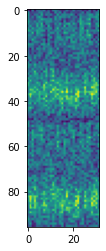

In [55]:
plt.imshow(test_1.w_EBCxHD_HD)

In [62]:
np.sum(test_1.EBC_spikes[6])

151771.0

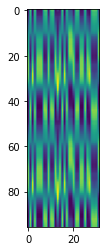

In [56]:
plt.imshow(test_1.w_EBCxHD_EBC)

In [38]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_2 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_2.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000


0

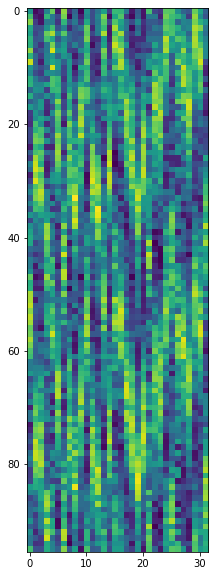

In [52]:
plt.figure(figsize=(10,10))
plt.imshow(test_2.w_EBCxHD_EBC)

In [69]:
test_2.rates_EBC

array([[0.2529    , 0.57961   , 0.773649  , ..., 1.91619843, 1.96870359,
        2.02383323],
       [0.25302302, 0.48082571, 0.68913457, ..., 1.95688415, 2.00532074,
        2.05678866],
       [0.25302302, 0.48082571, 0.68913457, ..., 2.11548957, 2.14806561,
        2.18525905],
       ...,
       [0.25595762, 0.48285357, 0.68656821, ..., 1.67539436, 1.76436726,
        1.84768619],
       [0.2529    , 0.47961   , 0.683649  , ..., 1.70971629, 1.7874002 ,
        1.86176518],
       [0.2529    , 0.47961   , 0.683649  , ..., 1.78261629, 1.8530102 ,
        1.92081418]])

0.32803294724171456

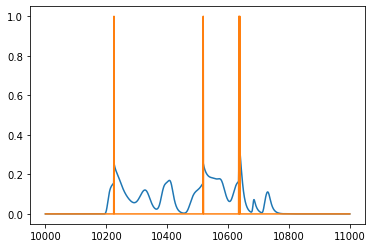

In [84]:
t1,t2 = 10000,11000
ys = test_2.rates_HD[16][t1:t2]
xs = np.arange(t1,t2)
ys2 = test_2.HD_spikes[16][t1:t2]
plt.plot(xs,ys)
plt.plot(xs,ys2)
np.max(ys)

In [88]:
np.max(test_2.rates_HD)

0.5095019305551964

In [89]:
np.max(test_2.rates_EBC)

4.970154257022956

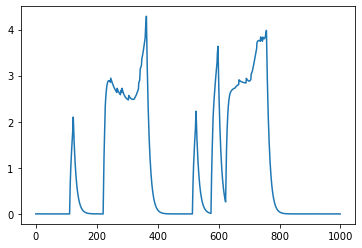

In [76]:
ys = test_2.rates_EBC[16][0:1000]
xs = np.arange(0,1000)
plt.plot(xs,ys)

In [77]:
np.max(ys)

4.288515210033126

In [73]:
ys2 = test_2.headdir_ind[0:1000]

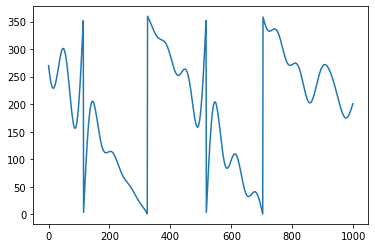

In [74]:
plt.plot(xs,ys2)

## lowered base input for EBC cells and threshold for firing for HD

In [90]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1
base_input_EBC = 0.002

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_3 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_3.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000


0

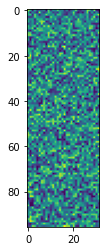

In [92]:
plt.imshow(test_3.w_EBCxHD_HD)

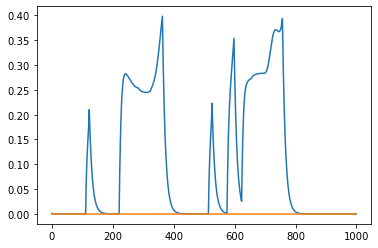

In [95]:
ys = test_3.rates_EBC[16][0:1000]
xs = np.arange(0,1000)
ys2 = test_3.EBC_spikes[16][0:1000]
plt.plot(xs,ys)
plt.plot(xs,ys2)

(0.0, 0.3)

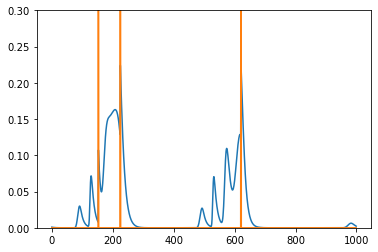

In [97]:
ys = test_3.rates_HD[16][0:1000]
xs = np.arange(0,1000)
ys2 = test_3.HD_spikes[16][0:1000]
plt.plot(xs,ys)
plt.plot(xs,ys2)
plt.ylim(0,0.3)

In [101]:
for i in range(len(test_3.HD_spikes)):
    print(np.sum(test_3.EBC_spikes[i]))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


# Beta = 0
threshold max is 0.5

In [103]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1
base_input_EBC = 0.002

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_4 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_4.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000


0

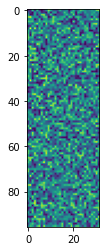

In [106]:
plt.imshow(test_4.w_EBCxHD_HD)

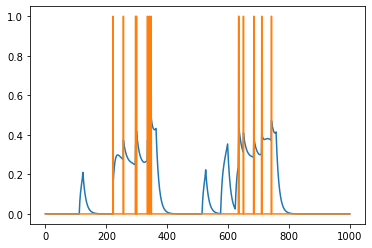

In [107]:
ys = test_4.rates_EBC[16][0:1000]
xs = np.arange(0,1000)
ys2 = test_4.EBC_spikes[16][0:1000]
plt.plot(xs,ys)
plt.plot(xs,ys2)

In [113]:
for i in range(96):
    print(np.sum(test_4.EBC_spikes[i]))

6841.0
6389.0
6779.0
6870.0
7129.0
7126.0
7455.0
7556.0
7820.0
7828.0
8108.0
8298.0
8363.0
8177.0
8370.0
8493.0
8415.0
8487.0
8125.0
8353.0
8237.0
8132.0
8156.0
8298.0
8112.0
8392.0
8358.0
8335.0
8508.0
8320.0
8426.0
8271.0
8154.0
8012.0
7610.0
7395.0
7127.0
7135.0
7132.0
6965.0
6917.0
6670.0
6708.0
6584.0
6627.0
6671.0
6598.0
6350.0
6751.0
6521.0
6617.0
6898.0
7115.0
7134.0
7517.0
7385.0
7733.0
7955.0
8124.0
8181.0
8206.0
8414.0
8415.0
8538.0
8442.0
8583.0
8312.0
8116.0
8236.0
8265.0
8170.0
8180.0
8265.0
8329.0
8393.0
8323.0
8222.0
8244.0
8099.0
8178.0
8125.0
7848.0
7513.0
7436.0
7395.0
6941.0
6956.0
6927.0
6795.0
6749.0
6475.0
6663.0
6525.0
6717.0
6496.0
6273.0


In [112]:
len(test_4.EBC_fields)

96

In [114]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1
base_input_HD = 0.2

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_5 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_5.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000


0

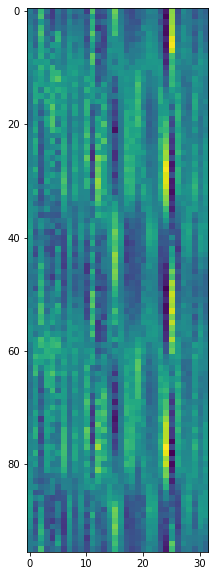

In [116]:
plt.figure(figsize=(10,10))
plt.imshow(test_5.w_EBCxHD_EBC)

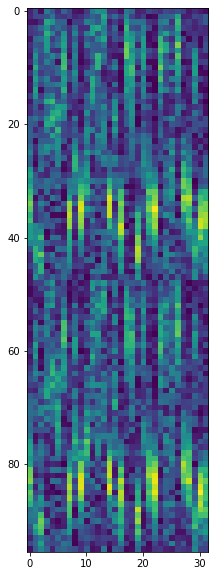

In [117]:
plt.figure(figsize=(10,10))
plt.imshow(test_5.w_EBCxHD_HD)

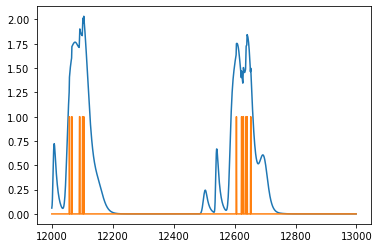

In [130]:
t1,t2 = 12000,13000
ys = test_5.rates_HD[16][t1:t2]
xs = np.arange(t1,t2)
ys2 = test_5.HD_spikes[16][t1:t2]
plt.plot(xs,ys)
plt.plot(xs,ys2)

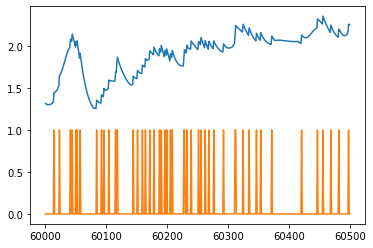

In [128]:
t1,t2 = 60000,60500
ys = test_5.rates_EBC[0][t1:t2]
xs = np.arange(t1,t2)
ys2 = test_5.EBC_spikes[0][t1:t2]
plt.plot(xs,ys)
plt.plot(xs,ys2)

# increasing base input of HD and beta also 
gives higher rate but less spiking

In [131]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1
base_input_HD = 0.5

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_6 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_6.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000


0

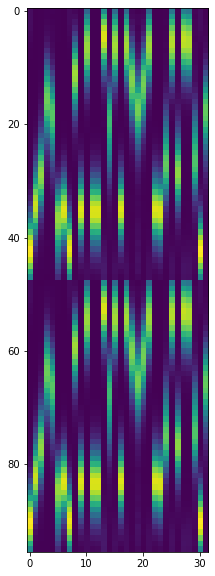

In [134]:
plt.figure(figsize=(10,10))
plt.imshow(test_6.w_EBCxHD_HD)

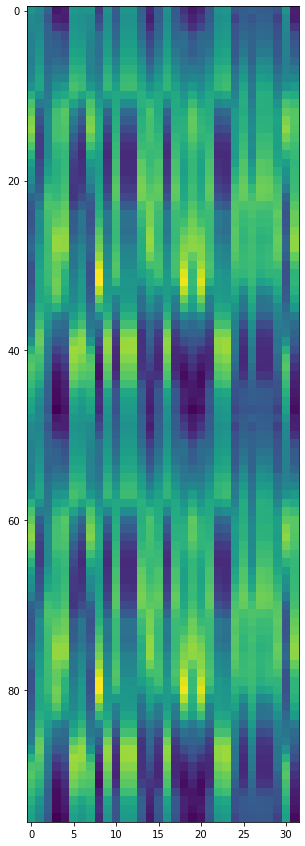

In [148]:
plt.figure(figsize=(15,15))
plt.imshow(test_6.w_EBCxHD_EBC)

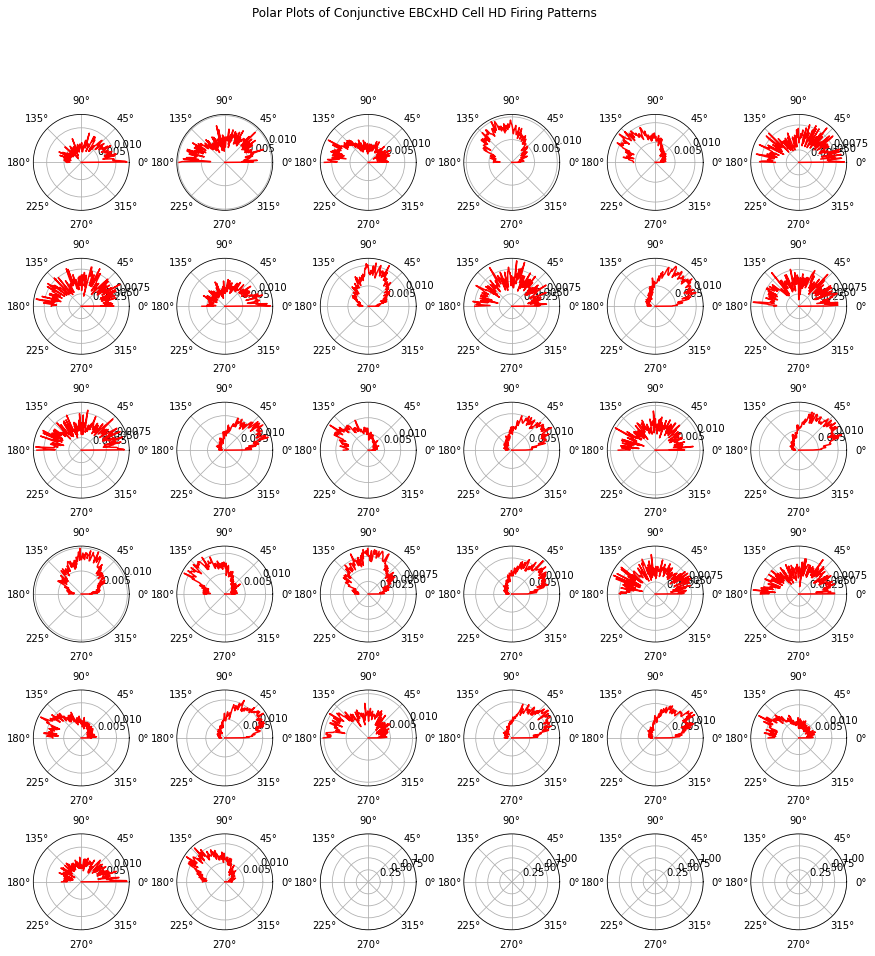

In [156]:
importlib.reload(clean_plot)
clean_plot.polar_EBCxHD_HD_firing(test_6,False,"")

In [162]:
binary = test_6.HD_spikes[0]
min(test_6.headdir_ind[binary>0])

0.002862647132895216

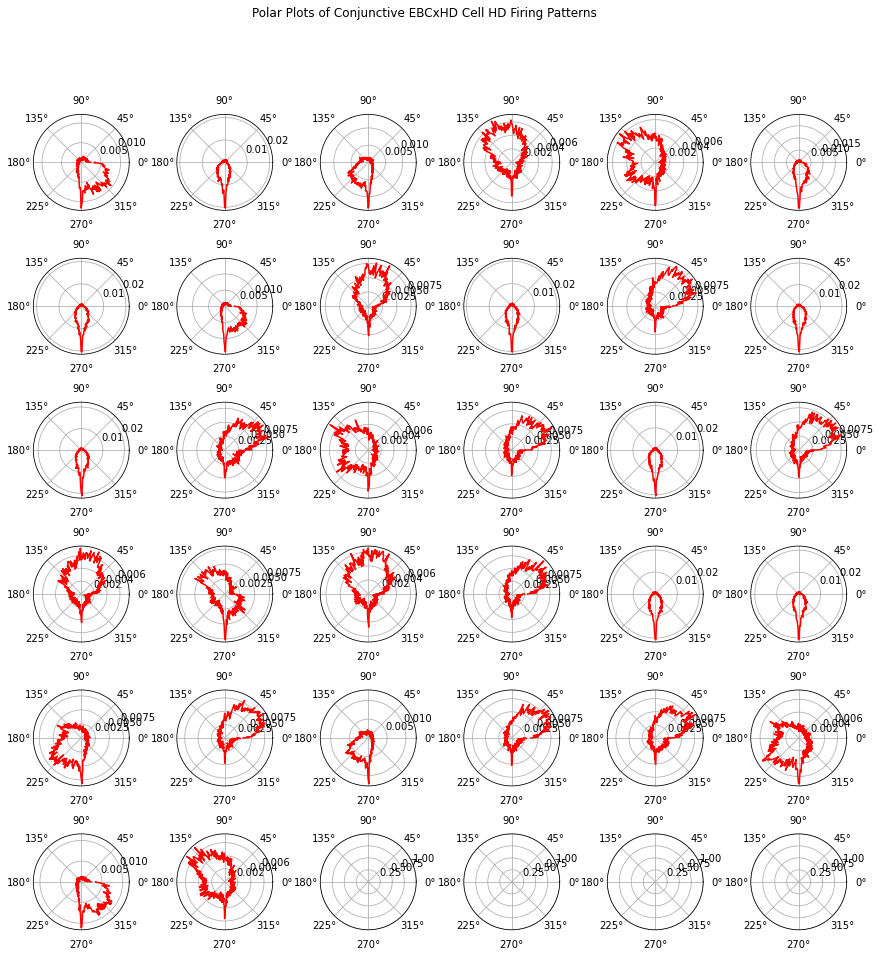

In [186]:
importlib.reload(clean_plot)
clean_plot.polar_EBCxHD_HD_firing(test_6,False,"")

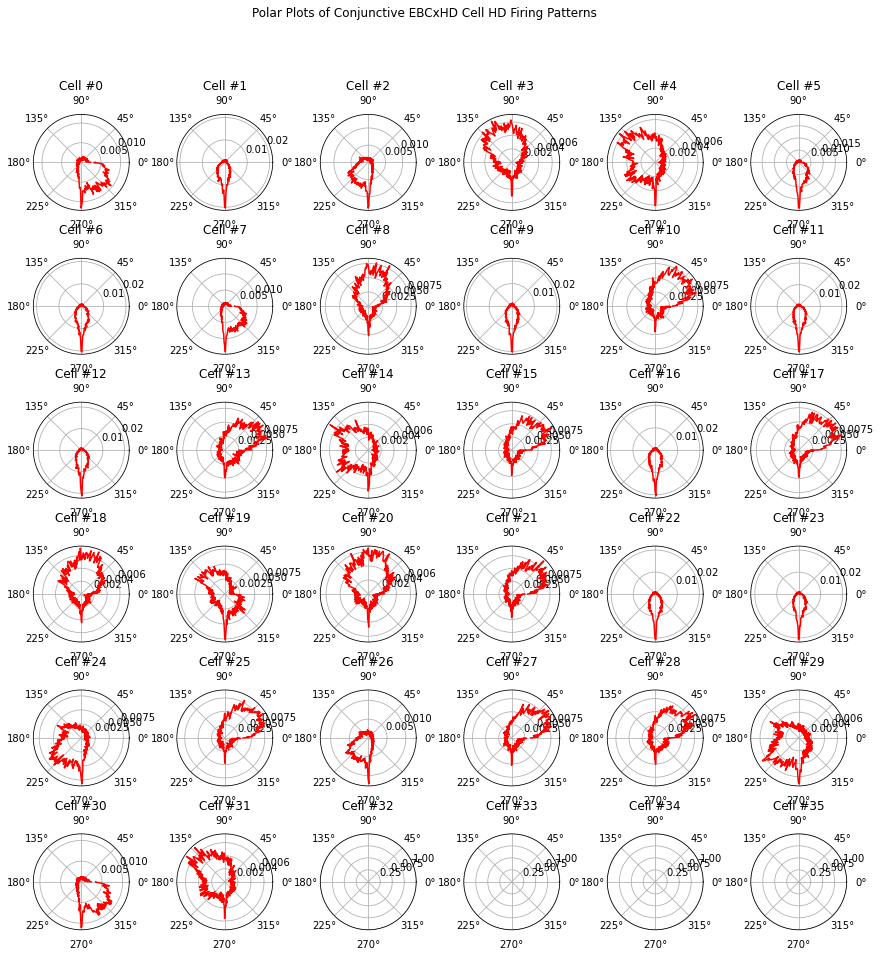

In [187]:
importlib.reload(clean_plot)

clean_plot.polar_EBCxHD_HD_firing(test_6,False,"")

In [257]:
def pdf_fun( x, sigma):
        # x = x - mu
    val = math.exp(-x*x/(sigma*sigma))
    return val

import math
sigma = 30
xs = np.arange(-180,180)
ys = np.array([pdf_fun(i, 30) for i in xs])
ys2_cos = np.array([np.cos(2*math.radians(i)) for i in xs])
ys2 = np.where(ys2_cos>0, ys2_cos, 0)


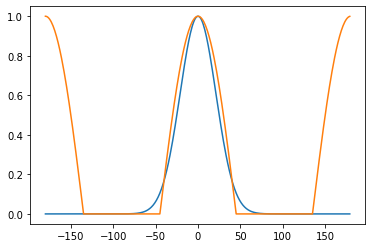

In [259]:
plt.plot(xs,ys)
plt.plot(xs,ys2)

In [353]:
n = len(angles_deg)
angles_deg = test_6.headdir_ind[test_6.EBCxHD_spikes[10]>0]
angles_rad = np.array([math.radians(i) for i in angles_deg])
cos_angles_rad = np.cos(angles_rad)
sin_angles_rad = np.sin(angles_rad)
x = np.sum(cos_angles_rad)/n
y = np.sum(sin_angles_rad)/n

Text(0, 0.5, 'Firing Counts')

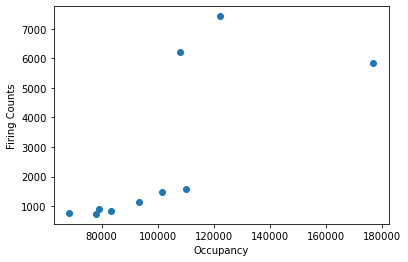

In [354]:
plt.scatter(counts_occ[:-1],counts_fire)
plt.xlabel("Occupancy")
plt.ylabel("Firing Counts")

In [326]:
bins = np.linspace(0,360,11) ##bins of width 36 degrees

binned_data = np.digitize(test_6.headdir_ind,bins) ## binned data in bins as defined above
unique_occ, counts_occ = np.unique(binned_data, return_counts=True) ### count frequencies of occurences of each bin

spike_bins = binned_data[test_6.EBCxHD_spikes[0]>0] ## filter by when spikes occurred
unique_fire, counts_fire = np.unique(spike_bins, return_counts=True) ## count frequencies of bins during spikes

## compute occupancy normalized firing rates (i.e. divide firing rates by time spent looking in that direction)
occupancy_norm = np.zeros(11)
for i in unique_fire:
    firing_rate = counts_fire[i-1]
    occupancy = counts_occ[i-1]
    occupancy_norm[i-1] = firing_rate/occupancy
    
# midpoints = array([ 18.,  54.,  90., 126., 162., 198., 234., 270., 306., 342.])
midpoints = np.zeros(11)
for i in range(11):
    midpoints[i] = 18 + 36*i
    

In [355]:
x_sum = 0
y_sum = 0
n = len(binned_data)
for i in range(len(midpoints)):
    a = math.radians(midpoints[i])
    f = occupancy_norm[i]
    x_sum += f*np.cos(a)
    y_sum += f*np.sin(a)

x = x_sum
y = y_sum
r = np.sqrt(x**2 + y**2)

In [356]:
r

0.1105425354568658

## headdir is sharpened cosine tuning

In [357]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1
base_input_HD = 0.5

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_7 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_7.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000


0

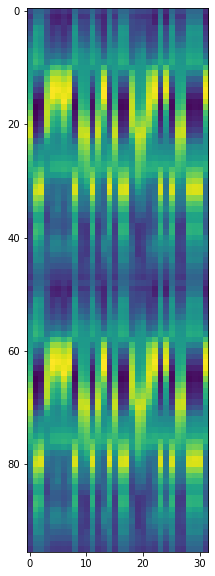

In [364]:
plt.figure(figsize=(10,10))
plt.imshow(test_7.w_EBCxHD_EBC)

In [371]:
i = 0
xs = test_7.x_ind[test_7.EBCxHD_spikes[i]>0]
ys = test_7.y_ind[test_7.EBCxHD_spikes[i]>0]

In [379]:
np.mean(test_7.rates_EBCxHD)

0.3770548832674957

In [381]:
np.mean(test_7.rates_EBC)

0.6868547396601088

## increased beta for conjunctive cells

In [405]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1
base_input_HD = 0.5

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_8 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_8.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
[[0.00740186]
 [0.00697061]
 [0.00713048]
 [0.00590871]
 [0.0063772 ]
 [0.00688959]
 [0.00714815]
 [0.00711562]
 [0.00552396]
 [0.00660098]
 [0.00738442]
 [0.00711604]
 [0.00689889]
 [0.00606704]
 [0.00609131]
 [0.00709818]
 [0.00637796]
 [0.00624548]
 [0.00702459]
 [0.0058736 ]
 [0.00690273]
 [0.00736143]
 [0.00630609]
 [0.0064154 ]
 [0.00702716]
 [0.0067901 ]
 [0.00643692]
 [0.00654711]
 [0.00621891]
 [0.00687805]
 [0.00662731]
 [0.00669888]]
[[0.01443173]
 [0.01335436]
 [0.01369414]
 [0.01129087]
 [0.0121028 ]
 [0.01316945]
 [0.01376354]
 [0.01367254]
 [0.0108014 ]
 [0.01257977]
 [0.01411845]
 [0.01389365]
 [0.01323899]
 [0.01170434]
 [0.01176894]
 [0.01355441]
 [0.01230594]
 [0.01204206]
 [0.0135453 ]
 [0.01122284]
 [0.01334099]
 [0.01406495]
 [0.0122894 ]
 [0.01246073]
 [0.01341528]
 [0.01305948]
 [0.01230468]
 [0.01251948]
 [0.01201118]
 [0.01334938]
 [0.01278417]
 [0.01288953]]
[[0.02064

[[0.06613727]
 [0.0683675 ]
 [0.07102825]
 [0.06042848]
 [0.06794692]
 [0.07350458]
 [0.07191652]
 [0.06694065]
 [0.0565679 ]
 [0.07012267]
 [0.07110037]
 [0.06380105]
 [0.06880288]
 [0.0664173 ]
 [0.06595162]
 [0.07420249]
 [0.06468989]
 [0.0589204 ]
 [0.06814891]
 [0.0647657 ]
 [0.06802383]
 [0.07725476]
 [0.06887274]
 [0.06032789]
 [0.07458909]
 [0.0684508 ]
 [0.06782558]
 [0.07040704]
 [0.06657996]
 [0.06843052]
 [0.06505854]
 [0.06809232]]
[[0.0660649 ]
 [0.06827659]
 [0.07096259]
 [0.06034516]
 [0.06780368]
 [0.07345471]
 [0.07178269]
 [0.06678716]
 [0.05647057]
 [0.07007179]
 [0.07103809]
 [0.0636963 ]
 [0.06872943]
 [0.06634086]
 [0.06582632]
 [0.07414562]
 [0.06465418]
 [0.0587773 ]
 [0.06798108]
 [0.06462195]
 [0.0678805 ]
 [0.0772202 ]
 [0.06881074]
 [0.0602753 ]
 [0.07446515]
 [0.06824324]
 [0.06770522]
 [0.07035935]
 [0.06643799]
 [0.06834568]
 [0.06493651]
 [0.06799428]]
[[0.06618064]
 [0.06849698]
 [0.07106871]
 [0.06042725]
 [0.06791887]
 [0.07366027]
 [0.07209095]
 [0.

 [0.0680817 ]]
[[0.06816387]
 [0.06909445]
 [0.07177581]
 [0.06001127]
 [0.06708673]
 [0.07064064]
 [0.07108992]
 [0.06802517]
 [0.05594833]
 [0.07056343]
 [0.07146244]
 [0.06653416]
 [0.0685848 ]
 [0.0647861 ]
 [0.06286743]
 [0.07344947]
 [0.06474569]
 [0.06024796]
 [0.06882804]
 [0.06342715]
 [0.0682612 ]
 [0.0759381 ]
 [0.0689082 ]
 [0.06371268]
 [0.07316073]
 [0.06749864]
 [0.06758383]
 [0.06803703]
 [0.06509025]
 [0.06814215]
 [0.06408706]
 [0.06801383]]
[[0.06876912]
 [0.06924573]
 [0.07187664]
 [0.05996178]
 [0.06694124]
 [0.0706425 ]
 [0.07128433]
 [0.06827762]
 [0.05584004]
 [0.07026266]
 [0.07190915]
 [0.06696528]
 [0.06879616]
 [0.06453646]
 [0.06273959]
 [0.07338308]
 [0.06467762]
 [0.06034986]
 [0.06908863]
 [0.0629767 ]
 [0.06846733]
 [0.07597532]
 [0.06851942]
 [0.06384802]
 [0.07311388]
 [0.06763869]
 [0.06741569]
 [0.06787239]
 [0.06496267]
 [0.06831883]
 [0.06439603]
 [0.06804023]]
[[0.06958236]
 [0.06952973]
 [0.07207548]
 [0.05995617]
 [0.06686681]
 [0.07075342]
 [0

[[0.06894173]
 [0.06715232]
 [0.07102831]
 [0.05874731]
 [0.06675733]
 [0.07319162]
 [0.07398753]
 [0.06845082]
 [0.05485312]
 [0.06752188]
 [0.07313362]
 [0.06678357]
 [0.06991899]
 [0.06322153]
 [0.06379759]
 [0.07289656]
 [0.06342565]
 [0.05832973]
 [0.06859949]
 [0.06210458]
 [0.06900542]
 [0.07671254]
 [0.06684644]
 [0.06022178]
 [0.07570234]
 [0.06766633]
 [0.06608945]
 [0.07012123]
 [0.0647691 ]
 [0.06958713]
 [0.06661713]
 [0.06750534]]
[[0.06900463]
 [0.06717288]
 [0.0710863 ]
 [0.05867953]
 [0.06685502]
 [0.07337781]
 [0.07401685]
 [0.06845842]
 [0.05485841]
 [0.06763504]
 [0.07308438]
 [0.06677222]
 [0.06985488]
 [0.06338372]
 [0.06383287]
 [0.0730368 ]
 [0.0633736 ]
 [0.0581686 ]
 [0.06855311]
 [0.06216188]
 [0.06904229]
 [0.0767713 ]
 [0.06699207]
 [0.06013433]
 [0.07578923]
 [0.06763337]
 [0.06609041]
 [0.07020871]
 [0.0648564 ]
 [0.06965282]
 [0.06670315]
 [0.06761   ]]
[[0.06889452]
 [0.06714866]
 [0.07100029]
 [0.05854004]
 [0.06669898]
 [0.07324689]
 [0.07387572]
 [0.

[[0.07596012]
 [0.07107866]
 [0.07328339]
 [0.05964617]
 [0.06491258]
 [0.07063312]
 [0.07362397]
 [0.07287918]
 [0.05684163]
 [0.06777608]
 [0.0759938 ]
 [0.07400176]
 [0.07067335]
 [0.06211258]
 [0.06209727]
 [0.07261015]
 [0.06454262]
 [0.06290947]
 [0.07156892]
 [0.05923411]
 [0.07085927]
 [0.07597208]
 [0.06501473]
 [0.0660496 ]
 [0.07259316]
 [0.06919661]
 [0.06555682]
 [0.06646163]
 [0.06376147]
 [0.07090981]
 [0.06733128]
 [0.06910985]]
[[0.076285  ]
 [0.07119774]
 [0.07350816]
 [0.05987496]
 [0.06500947]
 [0.07058785]
 [0.07358336]
 [0.07299253]
 [0.05712366]
 [0.06787621]
 [0.07601013]
 [0.07441207]
 [0.07066724]
 [0.06224715]
 [0.06231937]
 [0.07255555]
 [0.06456014]
 [0.06329058]
 [0.07158281]
 [0.05924891]
 [0.07107875]
 [0.07585964]
 [0.06510059]
 [0.06637828]
 [0.07264917]
 [0.06945538]
 [0.06563656]
 [0.06662632]
 [0.06402163]
 [0.07096121]
 [0.06767118]
 [0.06938605]]
[[0.0765364 ]
 [0.07126663]
 [0.07380905]
 [0.05991623]
 [0.06497441]
 [0.07054256]
 [0.07364674]
 [0.

[[0.06479569]
 [0.07168305]
 [0.06825473]
 [0.07121765]
 [0.0682152 ]
 [0.06909177]
 [0.0697915 ]
 [0.07203998]
 [0.0781029 ]
 [0.06449022]
 [0.06634455]
 [0.07190103]
 [0.06527862]
 [0.0704961 ]
 [0.07376404]
 [0.06761533]
 [0.0700998 ]
 [0.06729409]
 [0.06948295]
 [0.07156984]
 [0.07063479]
 [0.0625998 ]
 [0.06595042]
 [0.07547379]
 [0.06202814]
 [0.06692001]
 [0.07235427]
 [0.06130285]
 [0.06844197]
 [0.06925773]
 [0.07051481]
 [0.07626679]]
[[0.06494004]
 [0.07173741]
 [0.06814788]
 [0.07150337]
 [0.06837692]
 [0.06918784]
 [0.06984745]
 [0.07213075]
 [0.07847883]
 [0.06468163]
 [0.06633386]
 [0.07176537]
 [0.06545765]
 [0.07085948]
 [0.07405231]
 [0.0676157 ]
 [0.07023804]
 [0.06741108]
 [0.06977973]
 [0.07180514]
 [0.07064562]
 [0.06258347]
 [0.06590204]
 [0.07547786]
 [0.06220967]
 [0.06690081]
 [0.07242549]
 [0.061453  ]
 [0.06849005]
 [0.06957486]
 [0.07072138]
 [0.07628225]]
[[0.06512868]
 [0.07186933]
 [0.06807002]
 [0.07194247]
 [0.06860137]
 [0.06940522]
 [0.06995877]
 [0.

[[0.0673542 ]
 [0.07134416]
 [0.06502322]
 [0.07593865]
 [0.07254929]
 [0.06925488]
 [0.07046494]
 [0.07184901]
 [0.08352633]
 [0.06582216]
 [0.06744887]
 [0.06782329]
 [0.06836138]
 [0.07594377]
 [0.07642468]
 [0.06396292]
 [0.07512342]
 [0.07008042]
 [0.07154942]
 [0.07553553]
 [0.07010355]
 [0.06035905]
 [0.06773269]
 [0.07487325]
 [0.0644874 ]
 [0.06717103]
 [0.07448886]
 [0.06305519]
 [0.06922064]
 [0.07207966]
 [0.07364156]
 [0.07431697]]
[[0.06719503]
 [0.07126851]
 [0.0649184 ]
 [0.07576313]
 [0.07247412]
 [0.06911238]
 [0.07037947]
 [0.0717803 ]
 [0.08343774]
 [0.06568303]
 [0.0674131 ]
 [0.06770577]
 [0.06824964]
 [0.07579357]
 [0.07628853]
 [0.06378207]
 [0.07502279]
 [0.06987667]
 [0.07145927]
 [0.0753447 ]
 [0.07005749]
 [0.06021325]
 [0.06753836]
 [0.07474268]
 [0.0643485 ]
 [0.06703619]
 [0.0744431 ]
 [0.06287238]
 [0.06914135]
 [0.07201652]
 [0.07356993]
 [0.07425107]]
[[0.06701445]
 [0.07117351]
 [0.06485168]
 [0.07550878]
 [0.07229152]
 [0.0690157 ]
 [0.07023638]
 [0.

[[0.07087071]
 [0.06897236]
 [0.06382346]
 [0.07763605]
 [0.07390285]
 [0.06985676]
 [0.06684741]
 [0.07012781]
 [0.07984598]
 [0.07170024]
 [0.0659527 ]
 [0.06707017]
 [0.06962545]
 [0.07631935]
 [0.07438732]
 [0.066876  ]
 [0.07276201]
 [0.0753829 ]
 [0.07026029]
 [0.07434638]
 [0.06793164]
 [0.06545393]
 [0.06992753]
 [0.06952011]
 [0.06818825]
 [0.06854976]
 [0.06890006]
 [0.07013118]
 [0.07239911]
 [0.07185565]
 [0.07312903]
 [0.06802352]]
[[0.07014744]
 [0.06882822]
 [0.06430315]
 [0.07695556]
 [0.07369745]
 [0.06987875]
 [0.06647823]
 [0.06924312]
 [0.07853198]
 [0.07204968]
 [0.06575779]
 [0.0665111 ]
 [0.0695358 ]
 [0.07593193]
 [0.0738851 ]
 [0.06747661]
 [0.07227737]
 [0.07521784]
 [0.06988784]
 [0.07417179]
 [0.06755843]
 [0.06621528]
 [0.0705525 ]
 [0.06911527]
 [0.06854787]
 [0.06882919]
 [0.06886116]
 [0.07083683]
 [0.07271566]
 [0.07114137]
 [0.0722099 ]
 [0.067373  ]]
[[0.06908539]
 [0.06849196]
 [0.06478989]
 [0.07567732]
 [0.07316728]
 [0.06991391]
 [0.06637523]
 [0.

[[0.0686416 ]
 [0.06802645]
 [0.06418522]
 [0.07609913]
 [0.07333153]
 [0.06959223]
 [0.06536816]
 [0.06781781]
 [0.07672559]
 [0.07238745]
 [0.06484626]
 [0.06513595]
 [0.06935892]
 [0.07547311]
 [0.07295426]
 [0.0674408 ]
 [0.07176279]
 [0.07421327]
 [0.0687199 ]
 [0.07377015]
 [0.06639573]
 [0.06716122]
 [0.07061851]
 [0.06724982]
 [0.06892743]
 [0.06858374]
 [0.0686714 ]
 [0.07130186]
 [0.07287942]
 [0.06962944]
 [0.07085702]
 [0.06596944]]
[[0.06839068]
 [0.06847379]
 [0.06447679]
 [0.07606578]
 [0.07325906]
 [0.06962451]
 [0.06595081]
 [0.06843794]
 [0.07733266]
 [0.0718554 ]
 [0.06510474]
 [0.06562518]
 [0.06912757]
 [0.07550398]
 [0.07341747]
 [0.06743489]
 [0.0718934 ]
 [0.07368215]
 [0.06897804]
 [0.07392521]
 [0.06684007]
 [0.06670974]
 [0.0701085 ]
 [0.06806664]
 [0.06838836]
 [0.06851328]
 [0.06911155]
 [0.07039671]
 [0.07250836]
 [0.07002119]
 [0.07116461]
 [0.06710159]]
[[0.06799901]
 [0.06884756]
 [0.0647629 ]
 [0.07572132]
 [0.07281543]
 [0.06959961]
 [0.06629385]
 [0.

[[0.06251795]
 [0.06641852]
 [0.06822903]
 [0.06803228]
 [0.07039353]
 [0.07060131]
 [0.06536141]
 [0.06249822]
 [0.06423259]
 [0.07347818]
 [0.06574796]
 [0.06166558]
 [0.0686982 ]
 [0.06974999]
 [0.06774405]
 [0.07262045]
 [0.06748315]
 [0.06735527]
 [0.06493626]
 [0.0698799 ]
 [0.06501757]
 [0.07371989]
 [0.07287693]
 [0.06153266]
 [0.07141459]
 [0.06933086]
 [0.06812961]
 [0.0740364 ]
 [0.07208113]
 [0.06522341]
 [0.06415311]
 [0.06310872]]
[[0.06248963]
 [0.06646147]
 [0.06840695]
 [0.06753582]
 [0.0702948 ]
 [0.0708024 ]
 [0.06565845]
 [0.0627151 ]
 [0.06366776]
 [0.07343196]
 [0.06594439]
 [0.06174848]
 [0.06877989]
 [0.06950026]
 [0.06756186]
 [0.07293153]
 [0.06737534]
 [0.06690621]
 [0.06497642]
 [0.06959976]
 [0.06510846]
 [0.07394357]
 [0.0728228 ]
 [0.06130781]
 [0.0716232 ]
 [0.06932952]
 [0.06822793]
 [0.07384628]
 [0.07193471]
 [0.06528225]
 [0.06396548]
 [0.06330917]]
[[0.06233134]
 [0.06647763]
 [0.0684969 ]
 [0.06707434]
 [0.07008077]
 [0.0708658 ]
 [0.06577535]
 [0.

[[0.06383392]
 [0.06687698]
 [0.06790936]
 [0.07164565]
 [0.07212315]
 [0.06747893]
 [0.06237927]
 [0.0614138 ]
 [0.06745114]
 [0.07701324]
 [0.06416339]
 [0.06128496]
 [0.06871013]
 [0.07168986]
 [0.06742565]
 [0.0698123 ]
 [0.07004254]
 [0.07266262]
 [0.06549464]
 [0.07320741]
 [0.06436933]
 [0.0709169 ]
 [0.07703856]
 [0.06616367]
 [0.0713049 ]
 [0.06967897]
 [0.06950195]
 [0.07533746]
 [0.07394069]
 [0.06429595]
 [0.0633417 ]
 [0.06253456]]
[[0.06373058]
 [0.06684336]
 [0.06783469]
 [0.07160095]
 [0.07209113]
 [0.06737978]
 [0.06236429]
 [0.061359  ]
 [0.06735043]
 [0.07695955]
 [0.06422362]
 [0.06116035]
 [0.06863754]
 [0.07171841]
 [0.06740203]
 [0.0697221 ]
 [0.06991623]
 [0.07264038]
 [0.06547584]
 [0.07325963]
 [0.06430779]
 [0.07079519]
 [0.07700858]
 [0.06618726]
 [0.07127352]
 [0.06970104]
 [0.06948489]
 [0.07537439]
 [0.07390167]
 [0.06430017]
 [0.06336208]
 [0.06243876]]
[[0.0635985 ]
 [0.06670078]
 [0.06770422]
 [0.07158923]
 [0.07199059]
 [0.06721693]
 [0.06225044]
 [0.

[[0.06923257]
 [0.06969501]
 [0.06229152]
 [0.07743885]
 [0.07333047]
 [0.0693637 ]
 [0.06705353]
 [0.07213734]
 [0.08340129]
 [0.06764721]
 [0.064489  ]
 [0.0670926 ]
 [0.06758265]
 [0.07655323]
 [0.0763826 ]
 [0.06428336]
 [0.07271239]
 [0.07181507]
 [0.07066784]
 [0.07455882]
 [0.06757311]
 [0.06145134]
 [0.0661238 ]
 [0.07100971]
 [0.06448539]
 [0.06652672]
 [0.07047527]
 [0.06421543]
 [0.07036888]
 [0.07178481]
 [0.07456983]
 [0.07195971]]
[[0.06871613]
 [0.0698629 ]
 [0.06239615]
 [0.07687856]
 [0.07288012]
 [0.06919636]
 [0.0671466 ]
 [0.07199863]
 [0.08317007]
 [0.06721251]
 [0.06436363]
 [0.06721409]
 [0.06725975]
 [0.07613087]
 [0.07629667]
 [0.06430497]
 [0.07248734]
 [0.07129298]
 [0.07043368]
 [0.07430869]
 [0.0676173 ]
 [0.06122925]
 [0.06588805]
 [0.07123943]
 [0.06424799]
 [0.06639986]
 [0.07070022]
 [0.06383616]
 [0.07001971]
 [0.07146085]
 [0.07420238]
 [0.07240602]]
[[0.06841859]
 [0.07006485]
 [0.06266388]
 [0.07649692]
 [0.07251533]
 [0.06922529]
 [0.06749181]
 [0.

[[0.06464769]
 [0.06328919]
 [0.0621884 ]
 [0.07310206]
 [0.07056795]
 [0.06608607]
 [0.06091464]
 [0.06269442]
 [0.07153064]
 [0.07117922]
 [0.06141574]
 [0.0613653 ]
 [0.06637071]
 [0.071546  ]
 [0.06888234]
 [0.06454968]
 [0.06812988]
 [0.07338608]
 [0.0638228 ]
 [0.07117973]
 [0.06299606]
 [0.06490966]
 [0.07025448]
 [0.06382581]
 [0.06635343]
 [0.06578701]
 [0.06454909]
 [0.07112649]
 [0.07178086]
 [0.06448963]
 [0.06668858]
 [0.06086673]]
[[0.06419596]
 [0.06332374]
 [0.06262709]
 [0.07251962]
 [0.07036013]
 [0.06626743]
 [0.06093746]
 [0.0623498 ]
 [0.07083888]
 [0.07141774]
 [0.06143791]
 [0.06111541]
 [0.06637745]
 [0.07103818]
 [0.0685463 ]
 [0.06515864]
 [0.06790492]
 [0.07290963]
 [0.06352019]
 [0.07098333]
 [0.06302031]
 [0.06557614]
 [0.07049463]
 [0.06353596]
 [0.06660865]
 [0.06582235]
 [0.06460097]
 [0.07147195]
 [0.07180866]
 [0.06425417]
 [0.06597728]
 [0.06067393]]
[[0.06352526]
 [0.06316123]
 [0.06280585]
 [0.07173588]
 [0.06998203]
 [0.06624387]
 [0.06079701]
 [0.

[[0.07140788]
 [0.06395138]
 [0.05891519]
 [0.07973259]
 [0.07465953]
 [0.06681642]
 [0.05985684]
 [0.06543959]
 [0.07900067]
 [0.07158761]
 [0.06142009]
 [0.06263997]
 [0.06828108]
 [0.07714504]
 [0.07243049]
 [0.06218114]
 [0.07278263]
 [0.07890928]
 [0.06585007]
 [0.07349261]
 [0.06302747]
 [0.06248146]
 [0.06987565]
 [0.06445407]
 [0.06640495]
 [0.06660448]
 [0.06446553]
 [0.07082895]
 [0.07407509]
 [0.06927345]
 [0.07129954]
 [0.06058976]]
[[0.07169364]
 [0.06413312]
 [0.05879706]
 [0.07981753]
 [0.07485227]
 [0.06693975]
 [0.06008711]
 [0.0656248 ]
 [0.07938154]
 [0.07146859]
 [0.06160298]
 [0.06278548]
 [0.06842947]
 [0.07737757]
 [0.07276968]
 [0.06221131]
 [0.07304094]
 [0.07896122]
 [0.06609843]
 [0.07351953]
 [0.06312597]
 [0.06242152]
 [0.0696758 ]
 [0.0646301 ]
 [0.06632676]
 [0.06675174]
 [0.06475311]
 [0.07061378]
 [0.07408279]
 [0.06946974]
 [0.07147732]
 [0.0609072 ]]
[[0.07164294]
 [0.06410295]
 [0.05854571]
 [0.07961435]
 [0.07470913]
 [0.06686631]
 [0.06008706]
 [0.

[[0.07360454]
 [0.06823101]
 [0.05991532]
 [0.0816744 ]
 [0.0763231 ]
 [0.06902817]
 [0.06394134]
 [0.07059508]
 [0.08389454]
 [0.07190101]
 [0.06429732]
 [0.06584231]
 [0.07034495]
 [0.07913395]
 [0.07572724]
 [0.06371907]
 [0.07497255]
 [0.07855298]
 [0.06945743]
 [0.07551627]
 [0.06584129]
 [0.0628267 ]
 [0.06886338]
 [0.06747374]
 [0.06673783]
 [0.06729494]
 [0.06814767]
 [0.06924822]
 [0.07410951]
 [0.07268625]
 [0.07461343]
 [0.06525326]]
[[0.0735298 ]
 [0.06815575]
 [0.0597456 ]
 [0.08152887]
 [0.07626905]
 [0.06891662]
 [0.06371036]
 [0.07041213]
 [0.08378994]
 [0.07186428]
 [0.06425673]
 [0.06570101]
 [0.07028599]
 [0.0789835 ]
 [0.07561487]
 [0.06358459]
 [0.07490888]
 [0.07853468]
 [0.06934045]
 [0.07533998]
 [0.06571392]
 [0.06271865]
 [0.06877718]
 [0.06739381]
 [0.06667086]
 [0.06716656]
 [0.06800399]
 [0.06916833]
 [0.07407974]
 [0.07264264]
 [0.07447711]
 [0.06509284]]
[[0.07332743]
 [0.06803328]
 [0.05952874]
 [0.08138496]
 [0.07610672]
 [0.06873037]
 [0.06350882]
 [0.

[[0.0610264 ]
 [0.07128445]
 [0.06795915]
 [0.06722652]
 [0.06419491]
 [0.06481357]
 [0.06797595]
 [0.07135104]
 [0.07618214]
 [0.06137251]
 [0.06456882]
 [0.07133863]
 [0.06302737]
 [0.0666182 ]
 [0.07185354]
 [0.06611345]
 [0.06834999]
 [0.06497484]
 [0.0670701 ]
 [0.06953696]
 [0.06900992]
 [0.06058756]
 [0.0634155 ]
 [0.07517095]
 [0.05914028]
 [0.0663792 ]
 [0.07256781]
 [0.05967178]
 [0.06518073]
 [0.06737519]
 [0.06928142]
 [0.07685288]]
[[0.06101157]
 [0.07136463]
 [0.06800057]
 [0.06730281]
 [0.06431154]
 [0.06487782]
 [0.06810793]
 [0.07141501]
 [0.07625331]
 [0.06145451]
 [0.0645275 ]
 [0.07137807]
 [0.0630524 ]
 [0.06673559]
 [0.07189494]
 [0.06611027]
 [0.06839746]
 [0.06491877]
 [0.06714338]
 [0.06966306]
 [0.06911817]
 [0.06063842]
 [0.06351798]
 [0.07525994]
 [0.05921282]
 [0.06640582]
 [0.07258896]
 [0.05963015]
 [0.0653064 ]
 [0.06741461]
 [0.06946572]
 [0.07692747]]
[[0.06098644]
 [0.07127666]
 [0.06797136]
 [0.06737869]
 [0.06445887]
 [0.06494769]
 [0.0680729 ]
 [0.

[[0.07630644]
 [0.07044421]
 [0.07525447]
 [0.06083243]
 [0.06131497]
 [0.06736321]
 [0.07323475]
 [0.07481884]
 [0.05918542]
 [0.06490753]
 [0.07461615]
 [0.08020735]
 [0.06876099]
 [0.05998675]
 [0.06291252]
 [0.07064091]
 [0.06353204]
 [0.06709569]
 [0.07134609]
 [0.05921734]
 [0.0736161 ]
 [0.07130945]
 [0.06329262]
 [0.07240005]
 [0.06818264]
 [0.07116268]
 [0.06344641]
 [0.06658846]
 [0.06331402]
 [0.06979264]
 [0.069581  ]
 [0.07317596]]
[[0.07629368]
 [0.0704363 ]
 [0.07513447]
 [0.06071387]
 [0.06122642]
 [0.06739719]
 [0.07321644]
 [0.07472184]
 [0.05899701]
 [0.06493673]
 [0.07463614]
 [0.08007652]
 [0.06866939]
 [0.059886  ]
 [0.06269805]
 [0.07065282]
 [0.06342832]
 [0.06682672]
 [0.07130227]
 [0.05905196]
 [0.07351607]
 [0.07135606]
 [0.06317464]
 [0.07210695]
 [0.06826259]
 [0.07111572]
 [0.06337165]
 [0.06647057]
 [0.06321394]
 [0.06979515]
 [0.06948715]
 [0.07299885]]
[[0.07631484]
 [0.07044954]
 [0.07502206]
 [0.0606598 ]
 [0.0612876 ]
 [0.06732744]
 [0.07307528]
 [0.

[[0.06508225]
 [0.06617714]
 [0.06837422]
 [0.06900199]
 [0.07000712]
 [0.06800222]
 [0.06411288]
 [0.06251022]
 [0.06461721]
 [0.0743437 ]
 [0.06573272]
 [0.06249997]
 [0.06852013]
 [0.06919792]
 [0.06616088]
 [0.07012144]
 [0.06782782]
 [0.07032932]
 [0.06628377]
 [0.07028539]
 [0.06490192]
 [0.07099356]
 [0.07401705]
 [0.065693  ]
 [0.07029713]
 [0.06794472]
 [0.0676517 ]
 [0.07296801]
 [0.07199871]
 [0.06496302]
 [0.06365205]
 [0.06329373]]
[[0.06530346]
 [0.06595653]
 [0.06785827]
 [0.06982244]
 [0.07038777]
 [0.06788935]
 [0.0637286 ]
 [0.06248286]
 [0.06536629]
 [0.07452418]
 [0.06557231]
 [0.06240802]
 [0.06859   ]
 [0.06966058]
 [0.06653699]
 [0.06974235]
 [0.06816135]
 [0.07122855]
 [0.06624821]
 [0.07073877]
 [0.0647686 ]
 [0.07059434]
 [0.0741384 ]
 [0.0657397 ]
 [0.07014535]
 [0.06803191]
 [0.06756052]
 [0.07330277]
 [0.07233186]
 [0.06506684]
 [0.06399538]
 [0.06304682]]
[[0.0655787 ]
 [0.06579441]
 [0.06747664]
 [0.07083567]
 [0.07090995]
 [0.06776222]
 [0.06345076]
 [0.

[[0.06373182]
 [0.07179017]
 [0.06583947]
 [0.07300938]
 [0.06958856]
 [0.06750028]
 [0.07020083]
 [0.07082333]
 [0.08110946]
 [0.06333013]
 [0.06659148]
 [0.06963714]
 [0.06546191]
 [0.07344755]
 [0.07650456]
 [0.06414664]
 [0.07408189]
 [0.0676691 ]
 [0.06950716]
 [0.07398586]
 [0.06948273]
 [0.05966764]
 [0.06610326]
 [0.07605479]
 [0.06265516]
 [0.06699861]
 [0.07537769]
 [0.0613453 ]
 [0.06630339]
 [0.07068083]
 [0.07236765]
 [0.07550436]]
[[0.06355546]
 [0.071888  ]
 [0.06593908]
 [0.07288197]
 [0.06952743]
 [0.06750005]
 [0.07028236]
 [0.07086873]
 [0.08098095]
 [0.0632539 ]
 [0.06662942]
 [0.06976863]
 [0.06550352]
 [0.07327117]
 [0.07653525]
 [0.06436468]
 [0.07407315]
 [0.0675803 ]
 [0.06937047]
 [0.07396485]
 [0.06962473]
 [0.05970674]
 [0.06611466]
 [0.07619722]
 [0.06256187]
 [0.06706967]
 [0.0755183 ]
 [0.0612728 ]
 [0.06622478]
 [0.07058627]
 [0.0722524 ]
 [0.07562836]]
[[0.06337329]
 [0.07204022]
 [0.0660665 ]
 [0.07281001]
 [0.06936692]
 [0.0674784 ]
 [0.07039756]
 [0.

[[0.07544512]
 [0.06772785]
 [0.07305962]
 [0.05788081]
 [0.0617219 ]
 [0.06709695]
 [0.07307174]
 [0.07196603]
 [0.05545875]
 [0.06263554]
 [0.07511351]
 [0.07709224]
 [0.07027221]
 [0.05789731]
 [0.05995805]
 [0.06907439]
 [0.06193103]
 [0.06345194]
 [0.06878948]
 [0.05675548]
 [0.07318414]
 [0.07157411]
 [0.06250196]
 [0.06623184]
 [0.07034501]
 [0.06963135]
 [0.06331205]
 [0.06670965]
 [0.06269781]
 [0.06933361]
 [0.06796559]
 [0.06814837]]
[[0.07534364]
 [0.06757182]
 [0.07296131]
 [0.05775157]
 [0.06157065]
 [0.06701078]
 [0.07300429]
 [0.07186235]
 [0.05538119]
 [0.06250185]
 [0.07496805]
 [0.07699343]
 [0.07009086]
 [0.05775673]
 [0.05983266]
 [0.06903213]
 [0.06187555]
 [0.06334182]
 [0.06871995]
 [0.05667613]
 [0.07308844]
 [0.07147362]
 [0.06242441]
 [0.06615257]
 [0.0701382 ]
 [0.06953657]
 [0.06318146]
 [0.06656838]
 [0.06261861]
 [0.06923071]
 [0.06785474]
 [0.06807308]]
[[0.07542817]
 [0.06747983]
 [0.07295677]
 [0.05783596]
 [0.06161158]
 [0.06709613]
 [0.07305781]
 [0.

[[0.06099327]
 [0.06510009]
 [0.06895332]
 [0.06453104]
 [0.06921295]
 [0.07087637]
 [0.06429802]
 [0.06090621]
 [0.05987352]
 [0.07396331]
 [0.06502615]
 [0.05880856]
 [0.06733694]
 [0.0670695 ]
 [0.06541876]
 [0.07373294]
 [0.06545394]
 [0.06499068]
 [0.0649127 ]
 [0.06846303]
 [0.06351828]
 [0.07521658]
 [0.07399027]
 [0.0589833 ]
 [0.07197311]
 [0.06863395]
 [0.06777956]
 [0.07421998]
 [0.07230097]
 [0.06350539]
 [0.06077802]
 [0.06233636]]
[[0.06086149]
 [0.06504858]
 [0.06895032]
 [0.06428909]
 [0.06915268]
 [0.07083006]
 [0.06424693]
 [0.06088328]
 [0.05972838]
 [0.07382901]
 [0.06500167]
 [0.05879383]
 [0.06726981]
 [0.06693307]
 [0.06526653]
 [0.07362125]
 [0.06535701]
 [0.06470569]
 [0.06475861]
 [0.06834636]
 [0.06346551]
 [0.07520855]
 [0.07384462]
 [0.05887175]
 [0.07189583]
 [0.0684937 ]
 [0.0676344 ]
 [0.07417967]
 [0.0722411 ]
 [0.06335284]
 [0.06075164]
 [0.06231995]]
[[0.06061346]
 [0.06483504]
 [0.06873461]
 [0.06395478]
 [0.06891535]
 [0.07066418]
 [0.06409783]
 [0.

[[0.06373953]
 [0.07017122]
 [0.06798672]
 [0.06878766]
 [0.06522969]
 [0.06563127]
 [0.06815856]
 [0.07058032]
 [0.07476231]
 [0.06275263]
 [0.06563737]
 [0.0713076 ]
 [0.06438163]
 [0.06736291]
 [0.07109727]
 [0.06576684]
 [0.0683556 ]
 [0.06728622]
 [0.06708819]
 [0.06915548]
 [0.06980183]
 [0.06181141]
 [0.06507161]
 [0.07484215]
 [0.06091262]
 [0.06615735]
 [0.07057014]
 [0.06161691]
 [0.06656628]
 [0.06673197]
 [0.06932269]
 [0.07393913]]
[[0.06360493]
 [0.07021847]
 [0.06809961]
 [0.06867792]
 [0.06521717]
 [0.06565641]
 [0.06825591]
 [0.07067646]
 [0.07489801]
 [0.062547  ]
 [0.06566815]
 [0.07147841]
 [0.06429586]
 [0.06727287]
 [0.07110756]
 [0.06580066]
 [0.06837744]
 [0.06708529]
 [0.06703411]
 [0.0691817 ]
 [0.06991398]
 [0.0617204 ]
 [0.06496864]
 [0.07502424]
 [0.06077349]
 [0.06616421]
 [0.07074436]
 [0.0614165 ]
 [0.06643978]
 [0.06670535]
 [0.06938888]
 [0.07421991]]
[[0.06334331]
 [0.07018229]
 [0.06803356]
 [0.06866718]
 [0.06524565]
 [0.06568835]
 [0.06829064]
 [0.

[[0.06420886]
 [0.0736639 ]
 [0.07001397]
 [0.071024  ]
 [0.0682118 ]
 [0.06867242]
 [0.07165666]
 [0.07317579]
 [0.07971034]
 [0.06305117]
 [0.06605184]
 [0.07376772]
 [0.06568745]
 [0.0698982 ]
 [0.07480926]
 [0.06824579]
 [0.07182431]
 [0.06722831]
 [0.06836464]
 [0.07311267]
 [0.07174675]
 [0.06278083]
 [0.06591799]
 [0.07851156]
 [0.06132115]
 [0.06829447]
 [0.07438148]
 [0.06167396]
 [0.06770107]
 [0.0698708 ]
 [0.07238267]
 [0.07982867]]
[[0.0644453 ]
 [0.07372599]
 [0.07026252]
 [0.07103279]
 [0.06832257]
 [0.06893545]
 [0.07173393]
 [0.07339549]
 [0.07972694]
 [0.06311379]
 [0.06622156]
 [0.07408519]
 [0.06576939]
 [0.06976321]
 [0.07462171]
 [0.06828691]
 [0.07188971]
 [0.06743007]
 [0.06841951]
 [0.07309326]
 [0.07192235]
 [0.06298613]
 [0.06600339]
 [0.07865104]
 [0.06143243]
 [0.06843227]
 [0.07439149]
 [0.0617863 ]
 [0.06788332]
 [0.06993768]
 [0.07238092]
 [0.07991722]]
[[0.06443821]
 [0.07372446]
 [0.07043229]
 [0.0709162 ]
 [0.06823964]
 [0.06890978]
 [0.07177788]
 [0.

[[0.07545286]
 [0.06992055]
 [0.07369265]
 [0.05565595]
 [0.062783  ]
 [0.07059829]
 [0.07432134]
 [0.07206469]
 [0.053173  ]
 [0.06550263]
 [0.07649886]
 [0.07357899]
 [0.07078086]
 [0.05972581]
 [0.05934509]
 [0.07280608]
 [0.06227725]
 [0.05928399]
 [0.07114458]
 [0.05715629]
 [0.0715318 ]
 [0.07577473]
 [0.06351253]
 [0.06446805]
 [0.07333372]
 [0.07000627]
 [0.06504758]
 [0.06630306]
 [0.06158441]
 [0.07006879]
 [0.06564713]
 [0.06723747]]
[[0.07584255]
 [0.0701744 ]
 [0.07409667]
 [0.05583285]
 [0.06308931]
 [0.07095109]
 [0.0746584 ]
 [0.07233947]
 [0.05341741]
 [0.06580954]
 [0.07678674]
 [0.07399806]
 [0.07108725]
 [0.06001007]
 [0.05950102]
 [0.07303343]
 [0.06250654]
 [0.05957732]
 [0.07140208]
 [0.05731436]
 [0.07184276]
 [0.0760645 ]
 [0.06373202]
 [0.06471039]
 [0.07363495]
 [0.07031029]
 [0.06526853]
 [0.06659426]
 [0.06185777]
 [0.07045053]
 [0.06600919]
 [0.06756554]]
[[0.07597533]
 [0.07023811]
 [0.07419687]
 [0.05582594]
 [0.06315704]
 [0.070899  ]
 [0.07470222]
 [0.

[[0.07128827]
 [0.06762265]
 [0.07213253]
 [0.05488516]
 [0.06312439]
 [0.07071382]
 [0.07228289]
 [0.06832994]
 [0.05031406]
 [0.06655924]
 [0.07313798]
 [0.0671169 ]
 [0.06915205]
 [0.05980581]
 [0.05813286]
 [0.07378369]
 [0.06046882]
 [0.05584554]
 [0.07052529]
 [0.05787722]
 [0.06865461]
 [0.07598442]
 [0.0653107 ]
 [0.06069354]
 [0.07364212]
 [0.06796187]
 [0.06422601]
 [0.06666879]
 [0.06192878]
 [0.06760291]
 [0.06308889]
 [0.06612867]]
[[0.07102708]
 [0.06746843]
 [0.07201719]
 [0.05475481]
 [0.06316189]
 [0.07070323]
 [0.07212136]
 [0.06808908]
 [0.05020249]
 [0.06660773]
 [0.07289622]
 [0.06678336]
 [0.06899077]
 [0.05984535]
 [0.05816463]
 [0.07378431]
 [0.06037298]
 [0.05567752]
 [0.07038287]
 [0.05784786]
 [0.06847027]
 [0.07590853]
 [0.06531194]
 [0.06055054]
 [0.0736346 ]
 [0.06780174]
 [0.06412894]
 [0.06664982]
 [0.0618803 ]
 [0.06739738]
 [0.06290007]
 [0.066082  ]]
[[0.070723  ]
 [0.06740989]
 [0.07199094]
 [0.05476455]
 [0.06321568]
 [0.07081368]
 [0.07198889]
 [0.

[[0.06879654]
 [0.06814415]
 [0.06900808]
 [0.06463491]
 [0.06509955]
 [0.06683918]
 [0.06970561]
 [0.06945622]
 [0.06539407]
 [0.06427074]
 [0.0697845 ]
 [0.07052482]
 [0.06796926]
 [0.06441032]
 [0.06582809]
 [0.06746381]
 [0.06639886]
 [0.06543826]
 [0.06785061]
 [0.06485036]
 [0.06970257]
 [0.06727536]
 [0.06524601]
 [0.06889469]
 [0.0671126 ]
 [0.0677079 ]
 [0.06733372]
 [0.06557676]
 [0.06515131]
 [0.06799305]
 [0.06778707]
 [0.0685618 ]]
[[0.06869724]
 [0.06779376]
 [0.0692112 ]
 [0.06358741]
 [0.06475854]
 [0.06734408]
 [0.06996257]
 [0.06917174]
 [0.06376462]
 [0.06431535]
 [0.07013191]
 [0.06982137]
 [0.06814757]
 [0.06377688]
 [0.06512965]
 [0.0679517 ]
 [0.06563975]
 [0.06431298]
 [0.06781435]
 [0.06408297]
 [0.06946828]
 [0.06814472]
 [0.06523343]
 [0.067737  ]
 [0.06788612]
 [0.06754379]
 [0.06692558]
 [0.06580786]
 [0.06487915]
 [0.06793084]
 [0.06718694]
 [0.06811592]]
[[0.06815105]
 [0.06741794]
 [0.0692031 ]
 [0.06272349]
 [0.06462038]
 [0.06761746]
 [0.06982868]
 [0.

[[0.06969349]
 [0.0665048 ]
 [0.07010195]
 [0.06244202]
 [0.06459903]
 [0.06792897]
 [0.06949557]
 [0.06781364]
 [0.06009962]
 [0.06645278]
 [0.07055369]
 [0.06965256]
 [0.06888194]
 [0.06336718]
 [0.06369739]
 [0.06898301]
 [0.0639379 ]
 [0.06519827]
 [0.06764406]
 [0.0625582 ]
 [0.06899068]
 [0.07077614]
 [0.06599307]
 [0.06470299]
 [0.07040105]
 [0.06892439]
 [0.06482485]
 [0.06906737]
 [0.06571127]
 [0.067241  ]
 [0.06630529]
 [0.06583471]]
[[0.06927283]
 [0.06681822]
 [0.0703723 ]
 [0.06214101]
 [0.06394255]
 [0.06743731]
 [0.069731  ]
 [0.06807198]
 [0.06054515]
 [0.06565435]
 [0.0706098 ]
 [0.07036302]
 [0.06854319]
 [0.06292863]
 [0.06376386]
 [0.0686425 ]
 [0.06391925]
 [0.06521707]
 [0.06754073]
 [0.06261472]
 [0.06952654]
 [0.06993166]
 [0.06564196]
 [0.06583291]
 [0.06979059]
 [0.06889838]
 [0.06530853]
 [0.06855333]
 [0.06531856]
 [0.06687691]
 [0.06651634]
 [0.06649316]]
[[0.06913997]
 [0.06744713]
 [0.07079485]
 [0.06234262]
 [0.06377242]
 [0.06717713]
 [0.07019475]
 [0.

 [0.07873231]]
[[0.06854152]
 [0.07537821]
 [0.06800726]
 [0.07991974]
 [0.07617274]
 [0.07232658]
 [0.07471433]
 [0.07532628]
 [0.08792475]
 [0.06877701]
 [0.07009618]
 [0.07349189]
 [0.07033552]
 [0.07868422]
 [0.0819795 ]
 [0.06849292]
 [0.07918229]
 [0.07319482]
 [0.07353867]
 [0.07964978]
 [0.07400993]
 [0.06366326]
 [0.0702836 ]
 [0.07900799]
 [0.06754911]
 [0.0703688 ]
 [0.07899846]
 [0.06768328]
 [0.07154647]
 [0.07690449]
 [0.07827872]
 [0.078339  ]]
[[0.06867145]
 [0.07508364]
 [0.0675708 ]
 [0.08022212]
 [0.07634509]
 [0.07210887]
 [0.07442135]
 [0.07521621]
 [0.08798018]
 [0.06887501]
 [0.06990959]
 [0.07305299]
 [0.0703691 ]
 [0.07877368]
 [0.08187817]
 [0.0682536 ]
 [0.07920389]
 [0.07331972]
 [0.07342328]
 [0.07968442]
 [0.07363682]
 [0.0635095 ]
 [0.07027862]
 [0.07867414]
 [0.06756902]
 [0.07019357]
 [0.07877815]
 [0.06776258]
 [0.0715913 ]
 [0.0768561 ]
 [0.0782825 ]
 [0.07793234]]
[[0.06928069]
 [0.0751862 ]
 [0.06743534]
 [0.08105021]
 [0.0767915 ]
 [0.07230946]
 [0

[[0.08510618]
 [0.07808576]
 [0.08376337]
 [0.06455357]
 [0.06760965]
 [0.07390409]
 [0.08133822]
 [0.08155446]
 [0.06248275]
 [0.07003784]
 [0.08440482]
 [0.08565547]
 [0.07745116]
 [0.06566709]
 [0.06689375]
 [0.07770283]
 [0.06881647]
 [0.0702946 ]
 [0.07893696]
 [0.06392951]
 [0.08155098]
 [0.07967796]
 [0.07034425]
 [0.07693623]
 [0.07778787]
 [0.07880355]
 [0.07168647]
 [0.07174048]
 [0.06926832]
 [0.07717479]
 [0.07511963]
 [0.07783136]]
[[0.08503988]
 [0.07797128]
 [0.08368893]
 [0.06438569]
 [0.06755569]
 [0.073809  ]
 [0.08121571]
 [0.08145929]
 [0.06234193]
 [0.06989213]
 [0.08425578]
 [0.08557857]
 [0.0772641 ]
 [0.06554232]
 [0.06681655]
 [0.07772445]
 [0.0686687 ]
 [0.07023101]
 [0.07882164]
 [0.06384543]
 [0.08138053]
 [0.07956401]
 [0.07024232]
 [0.07675422]
 [0.07769729]
 [0.07863656]
 [0.07155381]
 [0.07157867]
 [0.06908724]
 [0.07712332]
 [0.07482065]
 [0.07773432]]
[[0.08504661]
 [0.07803525]
 [0.08363565]
 [0.06439014]
 [0.06758538]
 [0.07383407]
 [0.08120264]
 [0.

[[0.08143357]
 [0.07758071]
 [0.0835775 ]
 [0.06588045]
 [0.0652615 ]
 [0.07096506]
 [0.08016096]
 [0.08149784]
 [0.06559182]
 [0.06764767]
 [0.0819278 ]
 [0.08670461]
 [0.07440986]
 [0.06499246]
 [0.06900838]
 [0.07494353]
 [0.06878895]
 [0.07173047]
 [0.07777458]
 [0.06603429]
 [0.08108963]
 [0.07565133]
 [0.06911665]
 [0.08155689]
 [0.07342241]
 [0.0788373 ]
 [0.07151985]
 [0.0711231 ]
 [0.06856752]
 [0.07393631]
 [0.0765426 ]
 [0.08060511]]
[[0.08117668]
 [0.07781562]
 [0.08364091]
 [0.06608845]
 [0.06524105]
 [0.07079527]
 [0.08023038]
 [0.08145614]
 [0.06593422]
 [0.06766027]
 [0.08188579]
 [0.0866974 ]
 [0.07434614]
 [0.06501472]
 [0.06933067]
 [0.07487906]
 [0.06891002]
 [0.07194615]
 [0.07775614]
 [0.06634334]
 [0.08115587]
 [0.07545619]
 [0.06917854]
 [0.08192346]
 [0.07340852]
 [0.07883879]
 [0.07171611]
 [0.07124402]
 [0.06857148]
 [0.07374362]
 [0.07665053]
 [0.08072441]]
[[0.08104193]
 [0.07798022]
 [0.08380155]
 [0.06635771]
 [0.06519826]
 [0.07073751]
 [0.08027395]
 [0.

[[0.06615149]
 [0.07623944]
 [0.07472095]
 [0.07179742]
 [0.06796234]
 [0.06797677]
 [0.07418908]
 [0.07674465]
 [0.0804868 ]
 [0.06410724]
 [0.07037542]
 [0.07632027]
 [0.06762035]
 [0.06998478]
 [0.07595085]
 [0.07000756]
 [0.0725036 ]
 [0.06857964]
 [0.07131611]
 [0.07336949]
 [0.0751023 ]
 [0.06477449]
 [0.0683039 ]
 [0.08321218]
 [0.06233708]
 [0.07146593]
 [0.07820485]
 [0.06265957]
 [0.06870225]
 [0.07024403]
 [0.07512676]
 [0.08245633]]
[[0.06605847]
 [0.07625252]
 [0.07456673]
 [0.07187326]
 [0.06796285]
 [0.06793022]
 [0.0742225 ]
 [0.07663756]
 [0.08051464]
 [0.0640434 ]
 [0.07032533]
 [0.07629598]
 [0.06757918]
 [0.0701042 ]
 [0.07601733]
 [0.06992731]
 [0.07245579]
 [0.06851139]
 [0.07131287]
 [0.07354868]
 [0.07497101]
 [0.06463019]
 [0.06818583]
 [0.08307686]
 [0.06232652]
 [0.07134789]
 [0.0782243 ]
 [0.06269016]
 [0.06868553]
 [0.07014429]
 [0.07513333]
 [0.08239986]]
[[0.06588756]
 [0.07602245]
 [0.07424369]
 [0.07174064]
 [0.06783465]
 [0.06770543]
 [0.07402958]
 [0.

[[0.06207236]
 [0.06968018]
 [0.06272823]
 [0.0722599 ]
 [0.06727009]
 [0.06379951]
 [0.0661921 ]
 [0.06973562]
 [0.08152587]
 [0.06102641]
 [0.06133434]
 [0.06641763]
 [0.06187838]
 [0.07209113]
 [0.075794  ]
 [0.06119011]
 [0.07117324]
 [0.06512343]
 [0.0662686 ]
 [0.07217713]
 [0.06649773]
 [0.05613091]
 [0.06137647]
 [0.07476852]
 [0.05802079]
 [0.06336806]
 [0.07333268]
 [0.05834156]
 [0.06467775]
 [0.06833542]
 [0.07178295]
 [0.07490907]]
[[0.0620494 ]
 [0.0696466 ]
 [0.06262765]
 [0.07224087]
 [0.06726503]
 [0.06377694]
 [0.06614115]
 [0.06975133]
 [0.08157913]
 [0.06101663]
 [0.06127967]
 [0.06633651]
 [0.06193331]
 [0.07207877]
 [0.07574068]
 [0.06112375]
 [0.0711862 ]
 [0.06508262]
 [0.06623552]
 [0.07218138]
 [0.06645115]
 [0.05615457]
 [0.06133623]
 [0.07472015]
 [0.0579749 ]
 [0.06330765]
 [0.07336455]
 [0.05831339]
 [0.06477331]
 [0.06837056]
 [0.07176961]
 [0.07484639]]
[[0.06216895]
 [0.06976296]
 [0.06266534]
 [0.0723182 ]
 [0.0674432 ]
 [0.06380078]
 [0.06618445]
 [0.

[[0.06442185]
 [0.0654677 ]
 [0.05636965]
 [0.07643236]
 [0.07138848]
 [0.06357014]
 [0.06292872]
 [0.06748205]
 [0.08364274]
 [0.06329789]
 [0.0586267 ]
 [0.06227124]
 [0.06279214]
 [0.07472503]
 [0.07484162]
 [0.05786479]
 [0.07252202]
 [0.06828807]
 [0.06552085]
 [0.07415542]
 [0.06283871]
 [0.05513048]
 [0.0628912 ]
 [0.07007179]
 [0.05997706]
 [0.06062404]
 [0.07007946]
 [0.06022989]
 [0.06593812]
 [0.06919375]
 [0.07291849]
 [0.06917524]]
[[0.0644507 ]
 [0.06554654]
 [0.05642902]
 [0.07646409]
 [0.07146112]
 [0.06364248]
 [0.06304733]
 [0.0675287 ]
 [0.08365503]
 [0.06331537]
 [0.05861873]
 [0.06221109]
 [0.06270799]
 [0.07482697]
 [0.07489364]
 [0.05791952]
 [0.07257345]
 [0.06819993]
 [0.06552806]
 [0.07412276]
 [0.06286342]
 [0.05512945]
 [0.06286187]
 [0.07009143]
 [0.05991126]
 [0.06068985]
 [0.07008575]
 [0.06015897]
 [0.06588934]
 [0.06917668]
 [0.07299806]
 [0.06929015]]
[[0.0644023 ]
 [0.06549059]
 [0.05644191]
 [0.07635869]
 [0.07137319]
 [0.06367667]
 [0.06307487]
 [0.

[[0.06768024]
 [0.06661939]
 [0.06757674]
 [0.0627359 ]
 [0.06308281]
 [0.06496378]
 [0.0676905 ]
 [0.06783177]
 [0.06282296]
 [0.06308124]
 [0.06809745]
 [0.06849009]
 [0.06576926]
 [0.06291503]
 [0.06362367]
 [0.06559648]
 [0.0638602 ]
 [0.06361603]
 [0.06636433]
 [0.06284418]
 [0.06766552]
 [0.06598081]
 [0.06361638]
 [0.06660038]
 [0.0654095 ]
 [0.06585808]
 [0.06519002]
 [0.06377717]
 [0.06345493]
 [0.06560553]
 [0.06567318]
 [0.06700687]]
[[0.06749385]
 [0.06609401]
 [0.0675882 ]
 [0.06159114]
 [0.06258044]
 [0.06537297]
 [0.06778005]
 [0.06718765]
 [0.06110853]
 [0.06313462]
 [0.06814782]
 [0.06776485]
 [0.06578353]
 [0.06223804]
 [0.06266399]
 [0.06601543]
 [0.06290755]
 [0.06234084]
 [0.06628379]
 [0.06186799]
 [0.06728247]
 [0.06681281]
 [0.06343897]
 [0.06526576]
 [0.06610786]
 [0.06572506]
 [0.06449584]
 [0.06377023]
 [0.06293921]
 [0.06536777]
 [0.06486187]
 [0.06638228]]
[[0.06700962]
 [0.06578214]
 [0.06752979]
 [0.06073929]
 [0.06234027]
 [0.06573698]
 [0.06768909]
 [0.

[[0.06800479]
 [0.06671501]
 [0.06170403]
 [0.07526509]
 [0.07113851]
 [0.06491606]
 [0.06303987]
 [0.06754921]
 [0.07762579]
 [0.06757591]
 [0.06312909]
 [0.06570385]
 [0.06571046]
 [0.07374196]
 [0.07210689]
 [0.06188451]
 [0.07235976]
 [0.07340859]
 [0.06665126]
 [0.07256173]
 [0.06495305]
 [0.06016089]
 [0.06671834]
 [0.06995601]
 [0.0629511 ]
 [0.064754  ]
 [0.06858609]
 [0.06521974]
 [0.06898349]
 [0.0686579 ]
 [0.07119004]
 [0.06711663]]
[[0.06806955]
 [0.06632718]
 [0.06148874]
 [0.07595258]
 [0.07162027]
 [0.06501038]
 [0.06237727]
 [0.06702325]
 [0.07755072]
 [0.06842755]
 [0.0628194 ]
 [0.06503924]
 [0.06580993]
 [0.07426793]
 [0.07213793]
 [0.06193423]
 [0.07253241]
 [0.07421007]
 [0.06649884]
 [0.07281371]
 [0.06447953]
 [0.06050555]
 [0.06735373]
 [0.06939115]
 [0.06331967]
 [0.06491598]
 [0.06822359]
 [0.06604106]
 [0.06973082]
 [0.06839989]
 [0.07101298]
 [0.06645281]]
[[0.06784933]
 [0.06574897]
 [0.06110028]
 [0.07620957]
 [0.07170146]
 [0.06489712]
 [0.06167021]
 [0.

[[0.07174064]
 [0.06796906]
 [0.0736099 ]
 [0.05546794]
 [0.05626286]
 [0.06366053]
 [0.07204668]
 [0.07103228]
 [0.05513818]
 [0.05860793]
 [0.07347779]
 [0.07660982]
 [0.06649856]
 [0.05535657]
 [0.05860373]
 [0.06633593]
 [0.0598821 ]
 [0.06108743]
 [0.06804546]
 [0.05649   ]
 [0.07227466]
 [0.06792939]
 [0.06006012]
 [0.06964722]
 [0.06584797]
 [0.06925724]
 [0.06242644]
 [0.06246136]
 [0.05903081]
 [0.06440531]
 [0.06600967]
 [0.06928749]]
[[0.07120113]
 [0.068048  ]
 [0.07351598]
 [0.0556651 ]
 [0.05616965]
 [0.06326438]
 [0.0718832 ]
 [0.07091708]
 [0.05568481]
 [0.0583306 ]
 [0.07321349]
 [0.07664911]
 [0.06624221]
 [0.05543786]
 [0.05891578]
 [0.0659856 ]
 [0.05997363]
 [0.06127887]
 [0.06786662]
 [0.05692543]
 [0.07225807]
 [0.06734953]
 [0.06003865]
 [0.07028746]
 [0.06545651]
 [0.06919046]
 [0.06278333]
 [0.06236246]
 [0.05902129]
 [0.06410859]
 [0.06616397]
 [0.06958992]]
[[0.07094569]
 [0.06851122]
 [0.07382143]
 [0.05628801]
 [0.05640119]
 [0.06334792]
 [0.07203603]
 [0.

 [0.07218633]]
[[0.06158253]
 [0.06791797]
 [0.06935134]
 [0.05970332]
 [0.05662536]
 [0.05935916]
 [0.06804022]
 [0.06922759]
 [0.06543876]
 [0.05559191]
 [0.0660656 ]
 [0.07266886]
 [0.06101318]
 [0.05764266]
 [0.06339999]
 [0.06156629]
 [0.06215103]
 [0.06057449]
 [0.06363148]
 [0.0615226 ]
 [0.06948353]
 [0.05931114]
 [0.05906348]
 [0.07432498]
 [0.05734661]
 [0.06504114]
 [0.06646872]
 [0.05701136]
 [0.05863823]
 [0.06122124]
 [0.06608929]
 [0.07266513]]
[[0.06108367]
 [0.06785572]
 [0.06887307]
 [0.05996232]
 [0.05687497]
 [0.05932134]
 [0.06777087]
 [0.06901626]
 [0.06607417]
 [0.05554239]
 [0.06562463]
 [0.07218021]
 [0.06073943]
 [0.05797861]
 [0.06374888]
 [0.06142794]
 [0.06235027]
 [0.06046499]
 [0.06336874]
 [0.06177375]
 [0.06913749]
 [0.05892846]
 [0.05896164]
 [0.07419874]
 [0.05693704]
 [0.06473716]
 [0.06673464]
 [0.05668442]
 [0.05869465]
 [0.06135496]
 [0.06605874]
 [0.07272579]]
[[0.06078639]
 [0.06803659]
 [0.06864828]
 [0.06049237]
 [0.05729667]
 [0.05949081]
 [0

[[0.06067101]
 [0.06331954]
 [0.0551527 ]
 [0.07284851]
 [0.06693084]
 [0.06053542]
 [0.06069766]
 [0.06479457]
 [0.07959996]
 [0.05960871]
 [0.05697096]
 [0.06021869]
 [0.06000873]
 [0.0708934 ]
 [0.07187545]
 [0.05554085]
 [0.06942263]
 [0.06547418]
 [0.06206722]
 [0.07078693]
 [0.06082644]
 [0.05261613]
 [0.05936364]
 [0.06808393]
 [0.05633182]
 [0.05820133]
 [0.06775872]
 [0.05719145]
 [0.06248927]
 [0.06544142]
 [0.06958384]
 [0.06687484]]
[[0.06097541]
 [0.0633052 ]
 [0.05506266]
 [0.07331306]
 [0.06731962]
 [0.06072512]
 [0.06068224]
 [0.064954  ]
 [0.0799045 ]
 [0.05984273]
 [0.05714076]
 [0.06002821]
 [0.06035104]
 [0.07118137]
 [0.07215092]
 [0.05575336]
 [0.06966498]
 [0.06583476]
 [0.06226707]
 [0.07099275]
 [0.06085189]
 [0.05277535]
 [0.05963382]
 [0.06817547]
 [0.05649335]
 [0.05827198]
 [0.06783841]
 [0.05746437]
 [0.06277906]
 [0.06574941]
 [0.06987951]
 [0.06690468]]
[[0.06126157]
 [0.06338229]
 [0.05497046]
 [0.07353978]
 [0.06756763]
 [0.06090951]
 [0.06071018]
 [0.

 [0.073826  ]]
[[0.06103793]
 [0.06849576]
 [0.06243598]
 [0.0701235 ]
 [0.06532799]
 [0.06211823]
 [0.06610817]
 [0.06901151]
 [0.07824027]
 [0.05916344]
 [0.06153762]
 [0.06694186]
 [0.0607633 ]
 [0.0684581 ]
 [0.07280672]
 [0.06020389]
 [0.06922288]
 [0.06398966]
 [0.06463892]
 [0.070147  ]
 [0.06633703]
 [0.05546846]
 [0.06058367]
 [0.07394736]
 [0.05741344]
 [0.06225947]
 [0.07134263]
 [0.05755876]
 [0.062551  ]
 [0.06646688]
 [0.07063564]
 [0.07368989]]
[[0.06113695]
 [0.06819521]
 [0.0617827 ]
 [0.07063862]
 [0.06580553]
 [0.06212183]
 [0.06582994]
 [0.06882158]
 [0.07871438]
 [0.05937287]
 [0.06124583]
 [0.0663594 ]
 [0.06080242]
 [0.06890437]
 [0.0730133 ]
 [0.05990475]
 [0.06950086]
 [0.06421095]
 [0.06465322]
 [0.07039286]
 [0.06598582]
 [0.05523334]
 [0.06059073]
 [0.07367538]
 [0.05748306]
 [0.06202823]
 [0.07129667]
 [0.05762358]
 [0.06280351]
 [0.06671583]
 [0.07081126]
 [0.07336535]]
[[0.06129565]
 [0.06785198]
 [0.06128755]
 [0.07107151]
 [0.06620419]
 [0.06220084]
 [0

[[0.06394693]
 [0.06624742]
 [0.06278282]
 [0.06784412]
 [0.06505623]
 [0.06270642]
 [0.06509699]
 [0.0671926 ]
 [0.07186236]
 [0.06157572]
 [0.06321358]
 [0.0657963 ]
 [0.06303459]
 [0.0669818 ]
 [0.06844371]
 [0.06150393]
 [0.06719081]
 [0.06469963]
 [0.06477348]
 [0.06718735]
 [0.06518177]
 [0.05979441]
 [0.06196953]
 [0.06918583]
 [0.06085773]
 [0.06317435]
 [0.0677534 ]
 [0.06056331]
 [0.06325198]
 [0.06591954]
 [0.06797764]
 [0.06860646]]
[[0.06410939]
 [0.0658484 ]
 [0.06170423]
 [0.06903869]
 [0.06579005]
 [0.06254832]
 [0.0642735 ]
 [0.06672228]
 [0.07279797]
 [0.06206225]
 [0.06253389]
 [0.06499582]
 [0.0630329 ]
 [0.06800498]
 [0.06876838]
 [0.06089467]
 [0.0678815 ]
 [0.06558362]
 [0.06468578]
 [0.06781316]
 [0.06442896]
 [0.05935188]
 [0.06211943]
 [0.0687201 ]
 [0.06064669]
 [0.06281058]
 [0.06755123]
 [0.06081696]
 [0.06373064]
 [0.0660279 ]
 [0.06820403]
 [0.06788604]]
[[0.06430667]
 [0.06536342]
 [0.06067301]
 [0.07003992]
 [0.06650088]
 [0.06242747]
 [0.06336586]
 [0.

[[0.06032168]
 [0.06971587]
 [0.06106641]
 [0.07364774]
 [0.06770991]
 [0.06321065]
 [0.06536966]
 [0.069856  ]
 [0.08241973]
 [0.06022366]
 [0.06001046]
 [0.06545092]
 [0.06072706]
 [0.07202104]
 [0.07618057]
 [0.06002873]
 [0.07185549]
 [0.06453827]
 [0.0653106 ]
 [0.07312875]
 [0.06546724]
 [0.0543958 ]
 [0.06069036]
 [0.07523922]
 [0.05714885]
 [0.06140056]
 [0.07382909]
 [0.05711867]
 [0.06332371]
 [0.06775899]
 [0.07214596]
 [0.07513987]]
[[0.06028536]
 [0.06990362]
 [0.06134042]
 [0.07345276]
 [0.0674501 ]
 [0.06321213]
 [0.06547808]
 [0.06994612]
 [0.08225274]
 [0.06026284]
 [0.06015307]
 [0.06566776]
 [0.06076646]
 [0.07181877]
 [0.07612092]
 [0.06015028]
 [0.07177829]
 [0.06452194]
 [0.06531651]
 [0.07308513]
 [0.06567664]
 [0.05449917]
 [0.06074836]
 [0.07544364]
 [0.05703854]
 [0.06150749]
 [0.0739217 ]
 [0.05704781]
 [0.06328661]
 [0.06760532]
 [0.07212609]
 [0.07535526]]
[[0.06029284]
 [0.07004458]
 [0.06163824]
 [0.07329861]
 [0.06735648]
 [0.06330723]
 [0.06565283]
 [0.

[[0.06310038]
 [0.06424103]
 [0.05446066]
 [0.07744478]
 [0.07110062]
 [0.06189574]
 [0.059759  ]
 [0.0655677 ]
 [0.08256783]
 [0.06315178]
 [0.05721508]
 [0.05996439]
 [0.0618814 ]
 [0.07512598]
 [0.07423689]
 [0.05625174]
 [0.0727943 ]
 [0.06931712]
 [0.06320424]
 [0.07379043]
 [0.06017627]
 [0.0539286 ]
 [0.06177455]
 [0.06849124]
 [0.05809137]
 [0.05899116]
 [0.06912415]
 [0.0599201 ]
 [0.06552568]
 [0.0678654 ]
 [0.07163239]
 [0.06670635]]
[[0.06265567]
 [0.06450916]
 [0.05479717]
 [0.07690647]
 [0.07056359]
 [0.06181684]
 [0.06000791]
 [0.0657017 ]
 [0.0824044 ]
 [0.06262933]
 [0.05720908]
 [0.06019222]
 [0.06149221]
 [0.07463185]
 [0.07419846]
 [0.05630696]
 [0.07252273]
 [0.06867287]
 [0.06313952]
 [0.0735577 ]
 [0.06039236]
 [0.05374081]
 [0.06140685]
 [0.06888493]
 [0.05775263]
 [0.05895011]
 [0.06930731]
 [0.05944546]
 [0.065148  ]
 [0.06765811]
 [0.07145479]
 [0.06721447]]
[[0.06226184]
 [0.06478707]
 [0.05527395]
 [0.07630968]
 [0.07005394]
 [0.06175333]
 [0.06036626]
 [0.

[[0.06793627]
 [0.06682557]
 [0.07143767]
 [0.05463257]
 [0.05597031]
 [0.06266812]
 [0.07033585]
 [0.0687312 ]
 [0.05576462]
 [0.05807146]
 [0.07094142]
 [0.07301173]
 [0.06469456]
 [0.05498278]
 [0.05836893]
 [0.06541633]
 [0.05875306]
 [0.05852294]
 [0.06619999]
 [0.05643484]
 [0.07008126]
 [0.0662576 ]
 [0.05959062]
 [0.06778152]
 [0.06431421]
 [0.06703176]
 [0.06234203]
 [0.0609259 ]
 [0.05835335]
 [0.06298475]
 [0.06369849]
 [0.0681531 ]]
[[0.06728003]
 [0.06742718]
 [0.07146325]
 [0.05576414]
 [0.05647478]
 [0.06252545]
 [0.07046207]
 [0.06926313]
 [0.0574732 ]
 [0.05803374]
 [0.07059421]
 [0.07337551]
 [0.06449654]
 [0.05577128]
 [0.05943314]
 [0.06532669]
 [0.05962309]
 [0.05894   ]
 [0.06619521]
 [0.05763372]
 [0.07037739]
 [0.06572018]
 [0.0598273 ]
 [0.06895621]
 [0.06371117]
 [0.06704484]
 [0.0632559 ]
 [0.06067117]
 [0.05872227]
 [0.06305749]
 [0.06448566]
 [0.06922   ]]
[[0.06632347]
 [0.06768889]
 [0.07110405]
 [0.05661002]
 [0.05668012]
 [0.06210684]
 [0.07016028]
 [0.

[[0.07542605]
 [0.06752049]
 [0.07386037]
 [0.05218136]
 [0.05922303]
 [0.06916786]
 [0.07463988]
 [0.06948168]
 [0.04902834]
 [0.0616624 ]
 [0.0768955 ]
 [0.07349329]
 [0.07121919]
 [0.05442144]
 [0.05463556]
 [0.0711214 ]
 [0.05813959]
 [0.05654926]
 [0.07005809]
 [0.0526807 ]
 [0.07130077]
 [0.0755527 ]
 [0.06159007]
 [0.06079591]
 [0.07260524]
 [0.0701013 ]
 [0.0603759 ]
 [0.06463487]
 [0.05968803]
 [0.06758759]
 [0.06183568]
 [0.06500423]]
[[0.07549464]
 [0.06769298]
 [0.07394786]
 [0.05228902]
 [0.05909425]
 [0.06897168]
 [0.07464225]
 [0.06978348]
 [0.04930071]
 [0.06152215]
 [0.07686079]
 [0.0738693 ]
 [0.07108322]
 [0.05435196]
 [0.05481572]
 [0.07091505]
 [0.05815494]
 [0.05688451]
 [0.07006526]
 [0.052777  ]
 [0.07159726]
 [0.0751552 ]
 [0.06142167]
 [0.06124499]
 [0.07240971]
 [0.07010892]
 [0.06041476]
 [0.06446145]
 [0.05965192]
 [0.06755463]
 [0.0621671 ]
 [0.06524099]]
[[0.07559802]
 [0.06767956]
 [0.07404775]
 [0.05236877]
 [0.05890288]
 [0.06870189]
 [0.07452821]
 [0.

[[0.07179332]
 [0.07280737]
 [0.07640862]
 [0.06223348]
 [0.06147161]
 [0.06610907]
 [0.074511  ]
 [0.07432363]
 [0.06433772]
 [0.06217689]
 [0.07483644]
 [0.0785795 ]
 [0.06905302]
 [0.06072509]
 [0.0649202 ]
 [0.06912981]
 [0.0655741 ]
 [0.06484205]
 [0.07028251]
 [0.06333814]
 [0.07538524]
 [0.0692981 ]
 [0.06518531]
 [0.07608347]
 [0.0669038 ]
 [0.07162796]
 [0.06963396]
 [0.06439052]
 [0.0638383 ]
 [0.06778052]
 [0.069431  ]
 [0.07486781]]
[[0.07209091]
 [0.07225726]
 [0.07620696]
 [0.06139442]
 [0.06150121]
 [0.0667731 ]
 [0.07466238]
 [0.07391254]
 [0.0628257 ]
 [0.06240979]
 [0.07516602]
 [0.07776112]
 [0.06938114]
 [0.06025925]
 [0.06399083]
 [0.06966133]
 [0.0649641 ]
 [0.06395742]
 [0.07042192]
 [0.06259606]
 [0.07503404]
 [0.07022686]
 [0.06515889]
 [0.07445854]
 [0.06777826]
 [0.07146582]
 [0.06894007]
 [0.06476435]
 [0.06361261]
 [0.06787703]
 [0.06867726]
 [0.07381612]]
[[0.07187183]
 [0.07155193]
 [0.07588324]
 [0.06066982]
 [0.06159035]
 [0.06731163]
 [0.07452486]
 [0.

[[0.06570785]
 [0.06517869]
 [0.07051405]
 [0.0581929 ]
 [0.06565569]
 [0.07404475]
 [0.06876134]
 [0.06331889]
 [0.0517028 ]
 [0.07236387]
 [0.06908129]
 [0.06196573]
 [0.06914123]
 [0.06233524]
 [0.05986353]
 [0.07650373]
 [0.05940825]
 [0.0591451 ]
 [0.06803182]
 [0.06094795]
 [0.06570565]
 [0.0779253 ]
 [0.07003333]
 [0.0567218 ]
 [0.07512853]
 [0.06719397]
 [0.06187872]
 [0.07070478]
 [0.06756345]
 [0.06621829]
 [0.05851822]
 [0.0620233 ]]
[[0.06609574]
 [0.06537519]
 [0.07066494]
 [0.05796084]
 [0.06551952]
 [0.07422803]
 [0.06913175]
 [0.06371146]
 [0.05147977]
 [0.07220159]
 [0.06945528]
 [0.06218968]
 [0.06934099]
 [0.06221028]
 [0.0597617 ]
 [0.07668723]
 [0.05929221]
 [0.05889937]
 [0.06831067]
 [0.060668  ]
 [0.06606976]
 [0.07805009]
 [0.06984327]
 [0.05680092]
 [0.0753815 ]
 [0.06723175]
 [0.06201962]
 [0.07061826]
 [0.06736245]
 [0.06647592]
 [0.05869825]
 [0.06217422]]
[[0.066368  ]
 [0.06547691]
 [0.07080324]
 [0.0577348 ]
 [0.06536412]
 [0.07439955]
 [0.06948999]
 [0.

[[0.07549979]
 [0.07458843]
 [0.07840872]
 [0.0613189 ]
 [0.05984902]
 [0.06761747]
 [0.07789181]
 [0.07739753]
 [0.06292524]
 [0.06180833]
 [0.07828701]
 [0.08372178]
 [0.07004729]
 [0.0605381 ]
 [0.06608969]
 [0.07147201]
 [0.06376423]
 [0.06663665]
 [0.07342989]
 [0.06136187]
 [0.07829642]
 [0.07091082]
 [0.06307571]
 [0.07624107]
 [0.06940239]
 [0.07594426]
 [0.06722433]
 [0.06743013]
 [0.06333299]
 [0.06870196]
 [0.07315669]
 [0.07584967]]
[[0.07534463]
 [0.07468624]
 [0.07842548]
 [0.06143736]
 [0.0598988 ]
 [0.0675086 ]
 [0.07783464]
 [0.077448  ]
 [0.06326934]
 [0.06179908]
 [0.07824595]
 [0.08367508]
 [0.06995797]
 [0.06060043]
 [0.06631667]
 [0.07132823]
 [0.06390751]
 [0.06675946]
 [0.07337004]
 [0.06152929]
 [0.07837219]
 [0.07074036]
 [0.06315529]
 [0.07648944]
 [0.06926343]
 [0.07601331]
 [0.06743299]
 [0.06741414]
 [0.0633259 ]
 [0.06865647]
 [0.07326251]
 [0.0760118 ]]
[[0.07514512]
 [0.0747035 ]
 [0.07837473]
 [0.06155225]
 [0.05985435]
 [0.06746812]
 [0.07784356]
 [0.

[[0.06709872]
 [0.06959851]
 [0.06012391]
 [0.08303135]
 [0.07636831]
 [0.06922113]
 [0.06817787]
 [0.07213733]
 [0.09023729]
 [0.06593789]
 [0.06358431]
 [0.06627663]
 [0.06733026]
 [0.08013698]
 [0.08197283]
 [0.06118959]
 [0.07871065]
 [0.07407463]
 [0.06877994]
 [0.08071194]
 [0.06745117]
 [0.05976942]
 [0.06757248]
 [0.07509036]
 [0.06408582]
 [0.06417703]
 [0.07563254]
 [0.0654828 ]
 [0.07115576]
 [0.0737915 ]
 [0.07955508]
 [0.07441491]]
[[0.06723895]
 [0.06965047]
 [0.06019498]
 [0.08308623]
 [0.07645963]
 [0.06933013]
 [0.06818797]
 [0.07219102]
 [0.09043355]
 [0.06609718]
 [0.06354676]
 [0.06630446]
 [0.06749773]
 [0.08026949]
 [0.08201899]
 [0.0611343 ]
 [0.07878849]
 [0.07425784]
 [0.06884595]
 [0.08070821]
 [0.0674841 ]
 [0.05986655]
 [0.06760035]
 [0.07516554]
 [0.06418908]
 [0.06416934]
 [0.07570856]
 [0.06552458]
 [0.0712382 ]
 [0.07388967]
 [0.07952004]
 [0.07437592]]
[[0.0672481 ]
 [0.06960067]
 [0.06010637]
 [0.08319615]
 [0.07643379]
 [0.06930764]
 [0.06817785]
 [0.

[[0.05998442]
 [0.06047247]
 [0.06339829]
 [0.0689563 ]
 [0.0721667 ]
 [0.0667354 ]
 [0.05858046]
 [0.05467042]
 [0.0627682 ]
 [0.07688314]
 [0.06162175]
 [0.05564253]
 [0.06795944]
 [0.0703913 ]
 [0.06482633]
 [0.06862369]
 [0.06775907]
 [0.07322411]
 [0.06343256]
 [0.07077705]
 [0.05996917]
 [0.07018953]
 [0.07682283]
 [0.05873819]
 [0.07152111]
 [0.06688327]
 [0.06522806]
 [0.07757897]
 [0.07466865]
 [0.06191759]
 [0.0599287 ]
 [0.05610289]]
[[0.05978794]
 [0.06029174]
 [0.06327149]
 [0.06878416]
 [0.07198254]
 [0.06652767]
 [0.05842291]
 [0.05448818]
 [0.06256026]
 [0.07665766]
 [0.06142744]
 [0.05548255]
 [0.06772407]
 [0.07019435]
 [0.06460804]
 [0.06844749]
 [0.06752398]
 [0.07300366]
 [0.0632742 ]
 [0.07060839]
 [0.05982334]
 [0.07000638]
 [0.07663845]
 [0.05854223]
 [0.07130132]
 [0.06673015]
 [0.06504089]
 [0.07738294]
 [0.07442928]
 [0.06173869]
 [0.0597793 ]
 [0.05595561]]
[[0.05976617]
 [0.06033382]
 [0.0633149 ]
 [0.06876629]
 [0.07208358]
 [0.06657886]
 [0.05846651]
 [0.

[[0.07900698]
 [0.07026602]
 [0.07773022]
 [0.05485818]
 [0.06126491]
 [0.07133313]
 [0.07718475]
 [0.073603  ]
 [0.05180522]
 [0.06398952]
 [0.08040939]
 [0.07697627]
 [0.07392246]
 [0.05611907]
 [0.05695324]
 [0.07320641]
 [0.06106934]
 [0.05960243]
 [0.07299904]
 [0.05545372]
 [0.07536175]
 [0.07769423]
 [0.06438757]
 [0.06463967]
 [0.07469433]
 [0.07376866]
 [0.0635472 ]
 [0.06692351]
 [0.06191175]
 [0.06996669]
 [0.06455091]
 [0.06816677]]
[[0.07912887]
 [0.07049053]
 [0.0778684 ]
 [0.05510449]
 [0.06119965]
 [0.07104158]
 [0.077157  ]
 [0.07395256]
 [0.05220721]
 [0.0638997 ]
 [0.08033331]
 [0.07739686]
 [0.0737535 ]
 [0.05619558]
 [0.05722161]
 [0.07297196]
 [0.06114721]
 [0.05996052]
 [0.07299174]
 [0.05556964]
 [0.0755844 ]
 [0.07733567]
 [0.06442584]
 [0.0653898 ]
 [0.07441933]
 [0.07392837]
 [0.06372655]
 [0.0667731 ]
 [0.06193516]
 [0.06989435]
 [0.06498777]
 [0.06871641]]
[[0.07935458]
 [0.0707926 ]
 [0.0781385 ]
 [0.05543352]
 [0.0611766 ]
 [0.07079382]
 [0.07735872]
 [0.

2

In [452]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1
base_input_HD = 0.5

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_8 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_8.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000


0

In [459]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1
base_input_HD = 0.5

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_9 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_9.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000


0

## beta back down to 0.2

In [476]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1
base_input_HD = 0.5

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_10 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_10.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000


0

In [515]:
net = test_10
i = 0
xs = net.x_ind[net.EBCxHD_spikes[i]>0]
ys = net.y_ind[net.EBCxHD_spikes[i]>0]

In [521]:
rates = net.rates_EBCxHD[11]
xs = net.x_ind.flatten()
ys = net.y_ind.flatten()

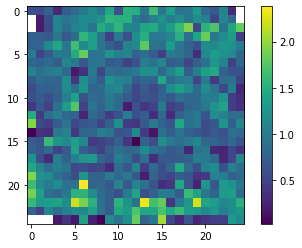

In [522]:
import scipy
statistic, xedges, yedges, bin_nums = scipy.stats.binned_statistic_2d(xs,ys,rates, bins = 25)
plt.imshow(statistic)
plt.colorbar()

In [526]:
np.mean(net.rates_EBC)

0.6868469298341625

In [536]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1
base_input_HD = 0.5

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_11 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_11.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000


0

In [551]:
np.sum(test_11.EBC_spikes[0])

11167.0

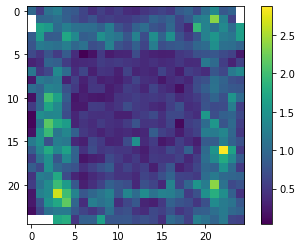

In [545]:
xs = test_11.x_ind.flatten()
ys = test_11.y_ind.flatten()
rates = test_11.rates_EBCxHD[29]
statistic, xedges, yedges, bin_nums = scipy.stats.binned_statistic_2d(xs,ys,rates, bins = 25)
plt.imshow(statistic)
plt.colorbar()

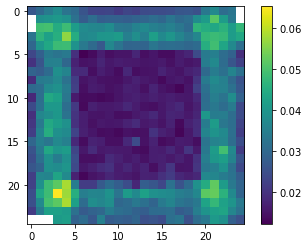

In [548]:
xs = test_11.x_ind.flatten()
ys = test_11.y_ind.flatten()
rates = test_11.rates_ABC[13]
statistic, xedges, yedges, bin_nums = scipy.stats.binned_statistic_2d(xs,ys,rates, bins = 25)
plt.imshow(statistic)
plt.colorbar()

In [553]:
test_11.EBCxHD_spikes

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

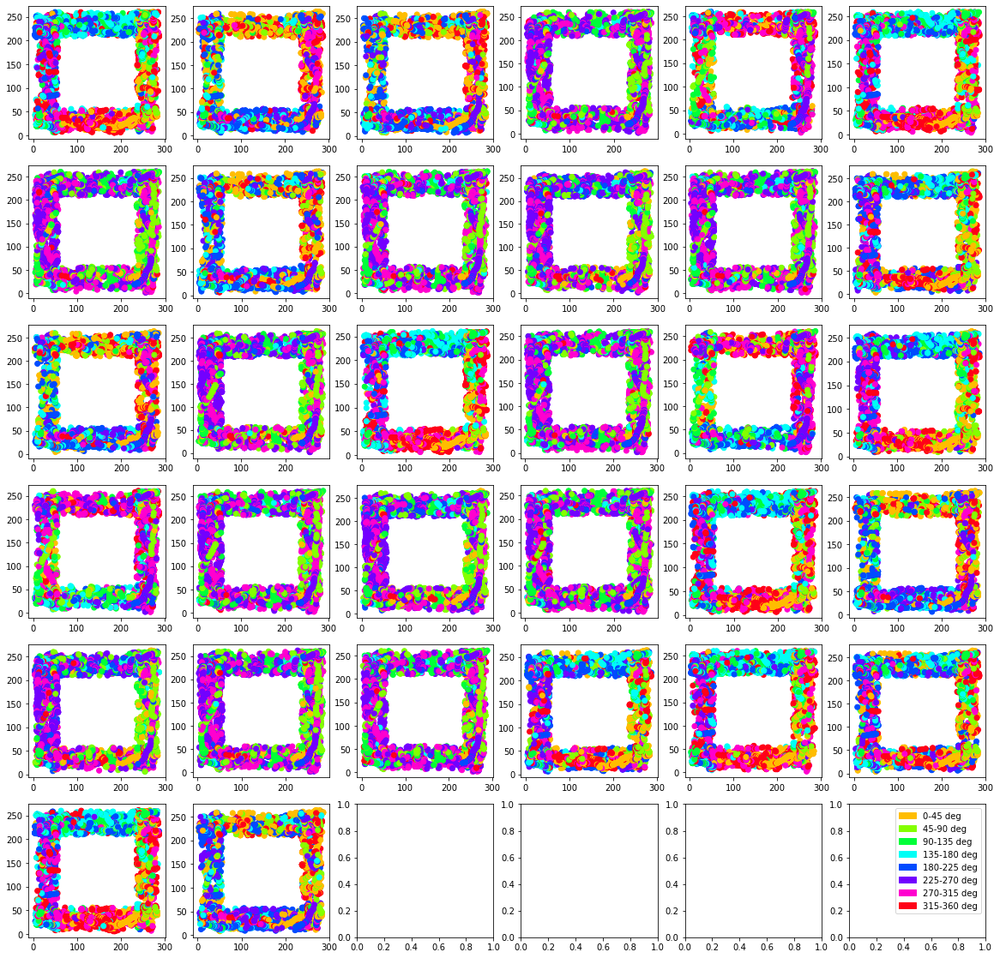

In [555]:
### lowering # spikes to be between 2000 and 3000
net = test_11
fig, ax = plt.subplots(6,6, figsize=(20,20))
xs = net.x_ind
ys = net.y_ind
cell_num = 0
start = 0.001
for i in range(6):
    for j in range(6):
        cell_num = 6*i + j
        if cell_num<32:
            spikes = net.EBCxHD_spikes[cell_num]
            filt_x = xs[spikes>0]
            filt_y = ys[spikes>0]
            filt_head = np.array(net.headdir_ind[spikes>0])
            pos_head=[filt_head[i] if filt_head[i]>0 else filt_head[i]+360 for i in range(len(filt_head))]
            bins = np.digitize(pos_head,[0,45,90,135,180,225,270,315,360])
            colors = [cm.hsv(bins[i]/8) for i in range(len(bins))]
            ax[i,j].scatter(filt_x,filt_y, c=colors)
            
import matplotlib.patches as mpatches
p_1 =  mpatches.Patch(color=cm.hsv(1/8), label="0-45 deg")
p_2 =  mpatches.Patch(color=cm.hsv(2/8), label="45-90 deg")
p_3 =  mpatches.Patch(color=cm.hsv(3/8), label="90-135 deg")
p_4 =  mpatches.Patch(color=cm.hsv(4/8), label="135-180 deg")
p_5 =  mpatches.Patch(color=cm.hsv(5/8), label="180-225 deg")
p_6 =  mpatches.Patch(color=cm.hsv(6/8), label="225-270 deg")
p_7 =  mpatches.Patch(color=cm.hsv(7/8), label="270-315 deg")
p_8 =  mpatches.Patch(color=cm.hsv(8/8), label="315-360 deg")


plt.legend(handles=[p_1,p_2,p_3,p_4,p_5,p_6,p_7,p_8])
plt.show()

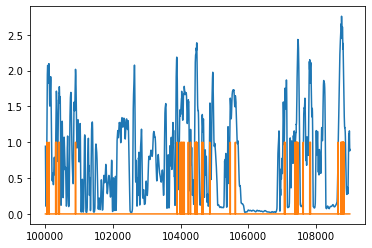

In [576]:
t1,t2 = 100000,109000
xs = np.arange(t1,t2)
ys_1 = test_11.rates_EBCxHD[i][t1:t2]
ys_2 = test_11.EBCxHD_spikes[i][t1:t2]
plt.plot(xs,ys_1)
plt.plot(xs,ys_2)

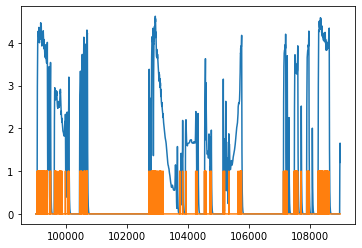

In [570]:
t1,t2 = 99000,109000
xs = np.arange(t1,t2)
ys_1 = test_11.rates_EBC[i][t1:t2]
ys_2 = test_11.EBC_spikes[i][t1:t2]
plt.plot(xs,ys_1)
plt.plot(xs,ys_2)

In [684]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1
base_input_HD = 0.5

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_11 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_11.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000


0

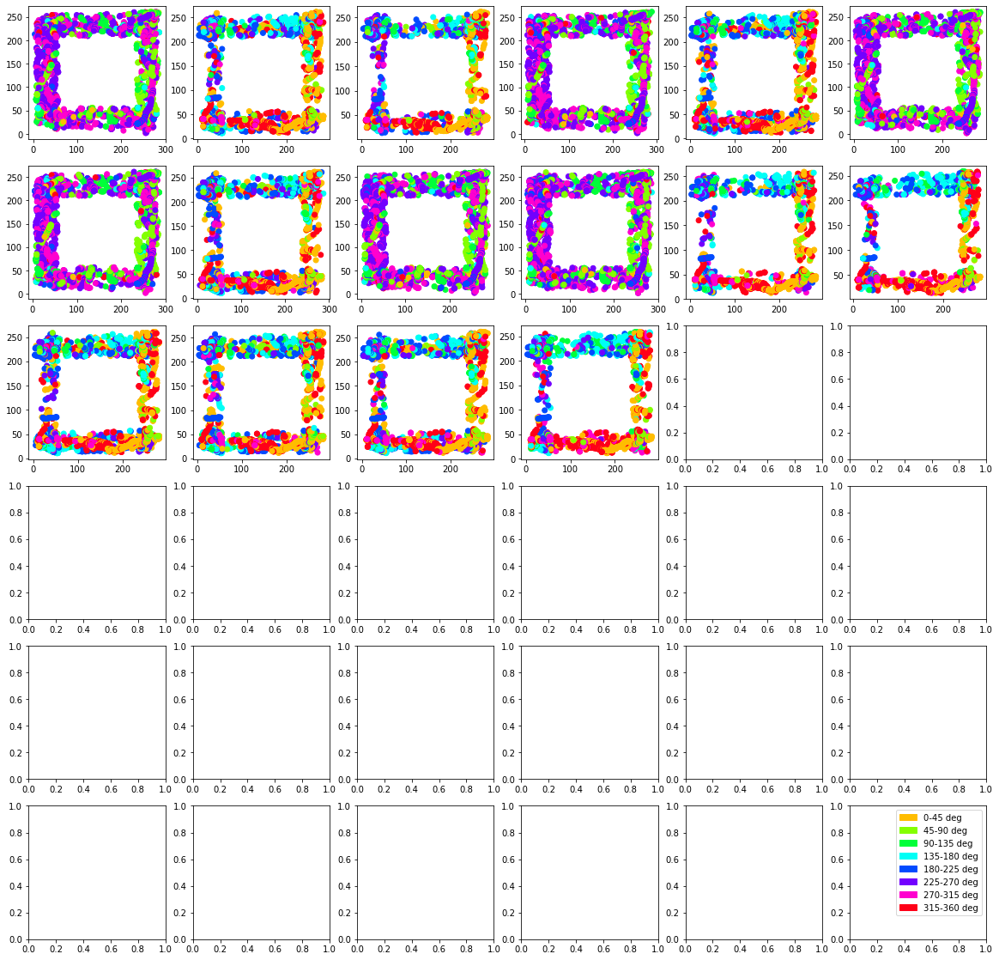

In [689]:
### lowering # spikes to be between 2000 and 3000
net = test_11
fig, ax = plt.subplots(6,6, figsize=(20,20))
xs = net.x_ind
ys = net.y_ind
cell_num = 0
start = 0.001
for i in range(6):
    for j in range(6):
        cell_num = 6*i + j
        if cell_num<16:
            spikes = net.ABC_spikes[cell_num]
            filt_x = xs[spikes>0]
            filt_y = ys[spikes>0]
            filt_head = np.array(net.headdir_ind[spikes>0])
            pos_head=[filt_head[i] if filt_head[i]>0 else filt_head[i]+360 for i in range(len(filt_head))]
            bins = np.digitize(pos_head,[0,45,90,135,180,225,270,315,360])
            colors = [cm.hsv(bins[i]/8) for i in range(len(bins))]
            ax[i,j].scatter(filt_x,filt_y, c=colors)
            
import matplotlib.patches as mpatches
p_1 =  mpatches.Patch(color=cm.hsv(1/8), label="0-45 deg")
p_2 =  mpatches.Patch(color=cm.hsv(2/8), label="45-90 deg")
p_3 =  mpatches.Patch(color=cm.hsv(3/8), label="90-135 deg")
p_4 =  mpatches.Patch(color=cm.hsv(4/8), label="135-180 deg")
p_5 =  mpatches.Patch(color=cm.hsv(5/8), label="180-225 deg")
p_6 =  mpatches.Patch(color=cm.hsv(6/8), label="225-270 deg")
p_7 =  mpatches.Patch(color=cm.hsv(7/8), label="270-315 deg")
p_8 =  mpatches.Patch(color=cm.hsv(8/8), label="315-360 deg")


plt.legend(handles=[p_1,p_2,p_3,p_4,p_5,p_6,p_7,p_8])
plt.show()

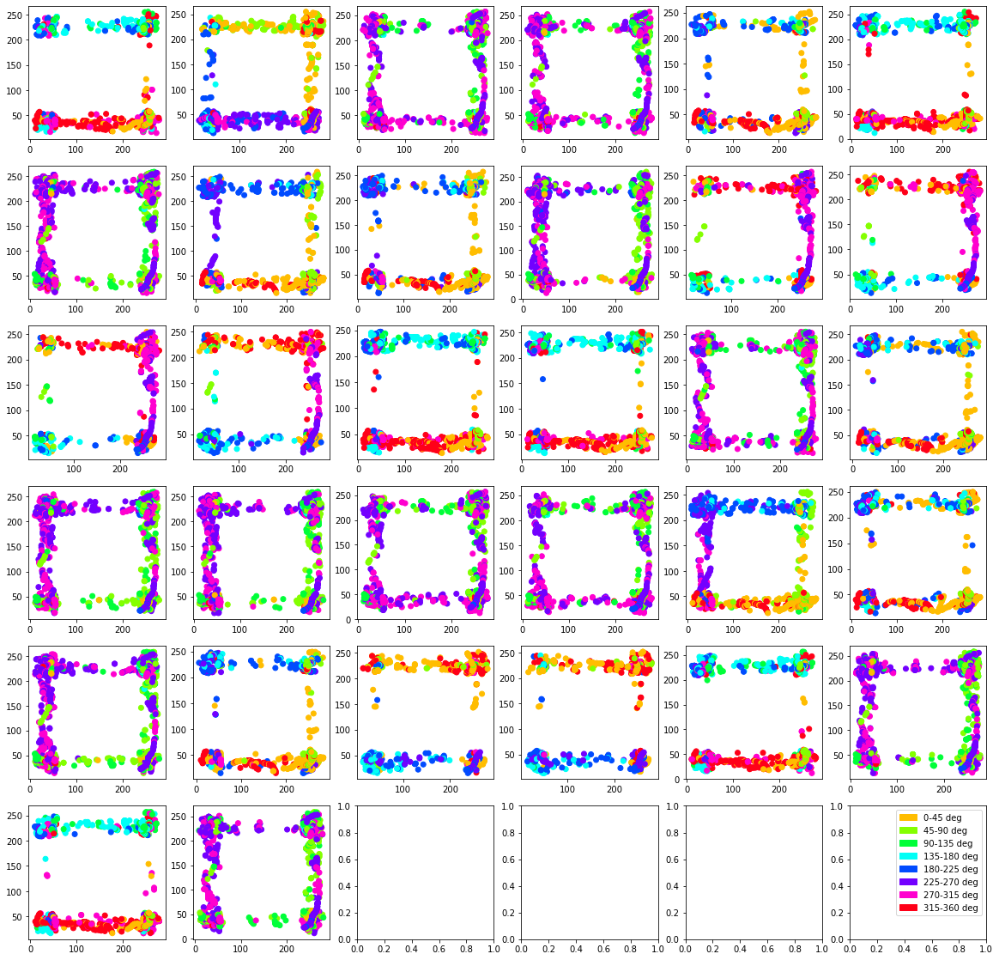

In [691]:
### lowering # spikes to be between 2000 and 3000
net = test_11
fig, ax = plt.subplots(6,6, figsize=(20,20))
xs = net.x_ind
ys = net.y_ind
cell_num = 0
start = 0.001
for i in range(6):
    for j in range(6):
        cell_num = 6*i + j
        if cell_num<32:
            spikes = net.EBCxHD_spikes[cell_num]
            filt_x = xs[spikes>0]
            filt_y = ys[spikes>0]
            filt_head = np.array(net.headdir_ind[spikes>0])
            pos_head=[filt_head[i] if filt_head[i]>0 else filt_head[i]+360 for i in range(len(filt_head))]
            bins = np.digitize(pos_head,[0,45,90,135,180,225,270,315,360])
            colors = [cm.hsv(bins[i]/8) for i in range(len(bins))]
            ax[i,j].scatter(filt_x,filt_y, c=colors)
            
import matplotlib.patches as mpatches
p_1 =  mpatches.Patch(color=cm.hsv(1/8), label="0-45 deg")
p_2 =  mpatches.Patch(color=cm.hsv(2/8), label="45-90 deg")
p_3 =  mpatches.Patch(color=cm.hsv(3/8), label="90-135 deg")
p_4 =  mpatches.Patch(color=cm.hsv(4/8), label="135-180 deg")
p_5 =  mpatches.Patch(color=cm.hsv(5/8), label="180-225 deg")
p_6 =  mpatches.Patch(color=cm.hsv(6/8), label="225-270 deg")
p_7 =  mpatches.Patch(color=cm.hsv(7/8), label="270-315 deg")
p_8 =  mpatches.Patch(color=cm.hsv(8/8), label="315-360 deg")


plt.legend(handles=[p_1,p_2,p_3,p_4,p_5,p_6,p_7,p_8])
plt.show()

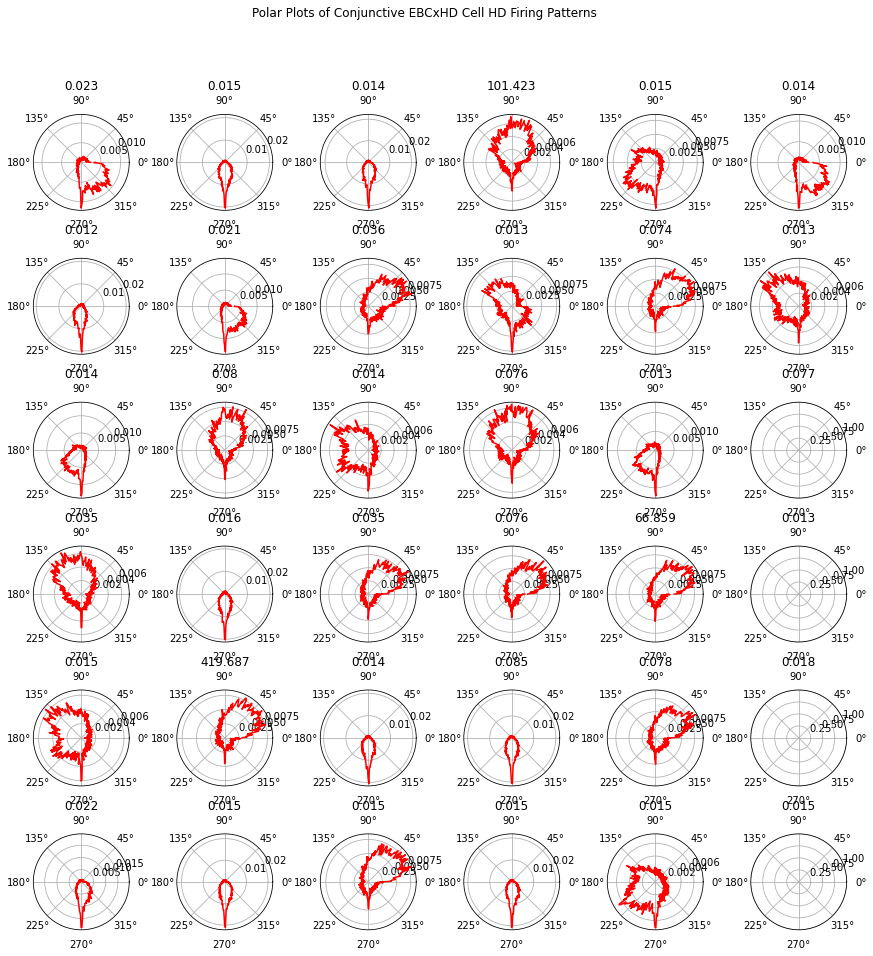

In [737]:
import clean_plot_good as clean_plot
importlib.reload(clean_plot)
save = False
path = ""
clean_plot.polar_EBCxHD_HD_firing(test_6,save,path)

IndexError: index 0 is out of bounds for axis 0 with size 0

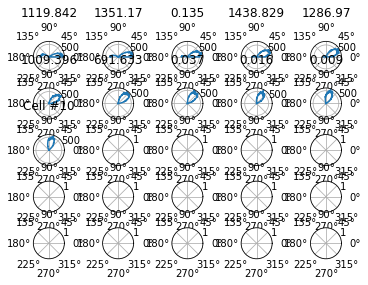

In [728]:
import clean_plot_good as clean_plot
importlib.reload(clean_plot)
save = False
path = ""
clean_plot.polar_HD_input_fields(test_11,save,path)

In [735]:
min(angles)

0.027938540527166048

5
7
10
12


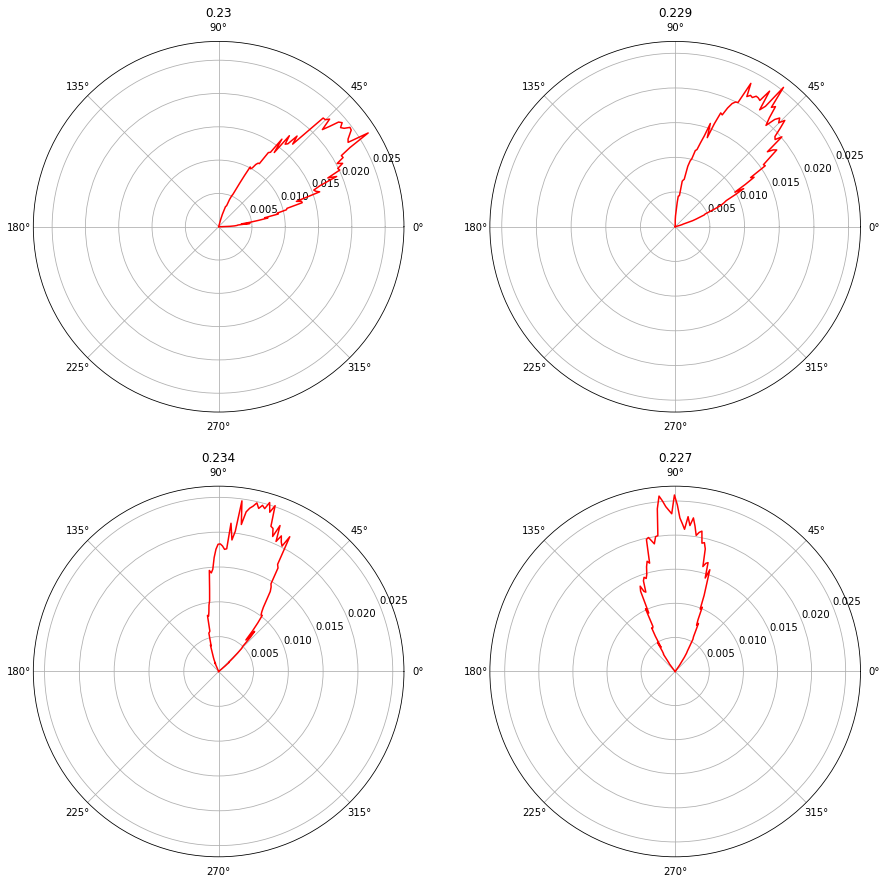

In [756]:
importlib.reload(clean_plot)
fig,ax = plt.subplots(2,2,subplot_kw={'projection': 'polar'},figsize=(15,15))
ind = 5
net = test_6
samples = [5,7,10,12]
for i in range(2):
    for j in range(2):
        ind = samples[2*i + j]
        print(ind)
        spikes = net.HD_spikes[ind] ## HD spike train for the first neuron
        angles = net.headdir_ind[spikes>0]
        hist, bin_edges = np.histogram(angles,360, range=(0,360), density=True)
        theta_rad =  np.linspace(0,2*np.pi,360)
        ax[i,j].plot(theta_rad, hist,'r')
        r = clean_plot.rayleigh(spikes,net.headdir_ind)
        ax[i,j].set_title(str(round(r,3)))

5
7
10
12


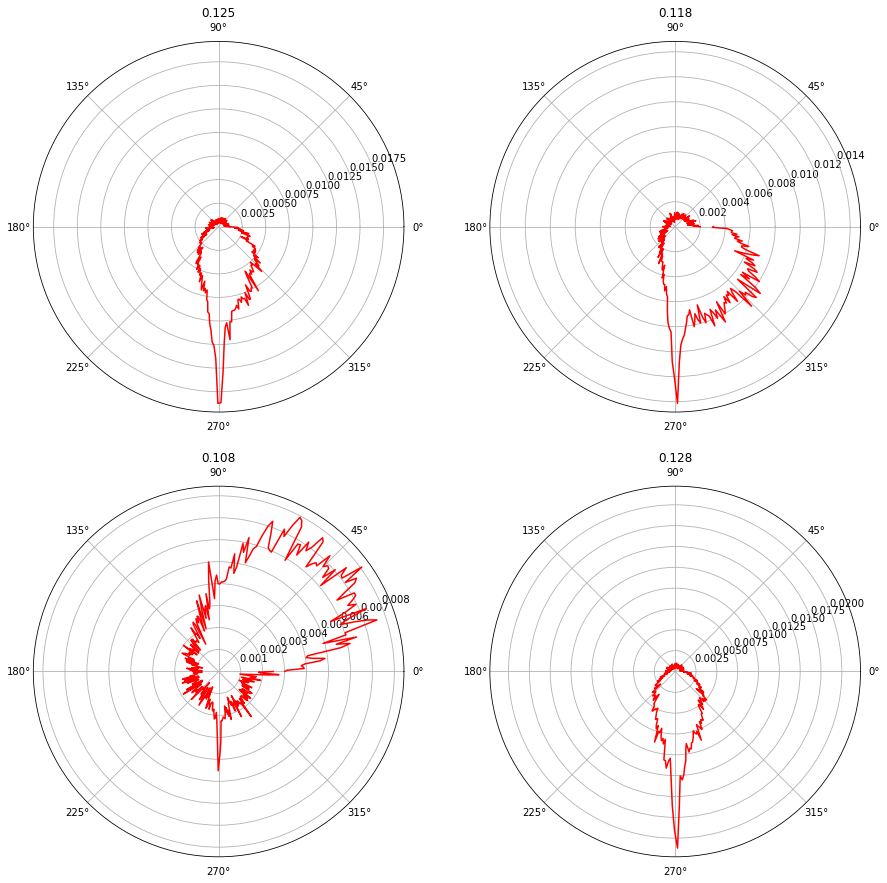

In [759]:
importlib.reload(clean_plot)
fig,ax = plt.subplots(2,2,subplot_kw={'projection': 'polar'},figsize=(15,15))
ind = 5
net = test_6
samples = [5,7,10,12]
for i in range(2):
    for j in range(2):
        ind = samples[2*i + j]
        print(ind)
        spikes = net.EBCxHD_spikes[ind] ## HD spike train for the first neuron
        angles = net.headdir_ind[spikes>0]
        hist, bin_edges = np.histogram(angles,360, range=(0,360), density=True)
        theta_rad =  np.linspace(0,2*np.pi,360)
        ax[i,j].plot(theta_rad, hist,'r')
        r = clean_plot.rayleigh(spikes,net.headdir_ind)
        ax[i,j].set_title(str(round(r,3)))

15
6
11
14


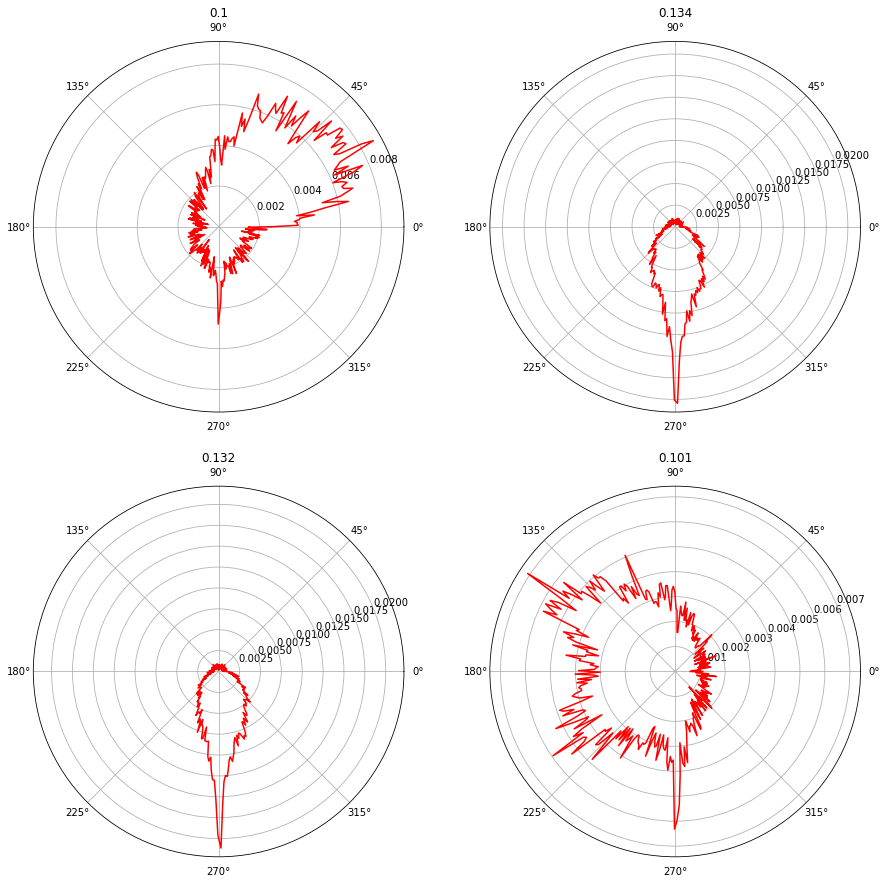

In [758]:
importlib.reload(clean_plot)
fig,ax = plt.subplots(2,2,subplot_kw={'projection': 'polar'},figsize=(15,15))
ind = 5
net = test_6
samples = [15,6,11,14]
for i in range(2):
    for j in range(2):
        ind = samples[2*i + j]
        print(ind)
        spikes = net.EBCxHD_spikes[ind] ## HD spike train for the first neuron
        angles = net.headdir_ind[spikes>0]
        hist, bin_edges = np.histogram(angles,360, range=(0,360), density=True)
        theta_rad =  np.linspace(0,2*np.pi,360)
        ax[i,j].plot(theta_rad, hist,'r')
        r = clean_plot.rayleigh(spikes,net.headdir_ind)
        ax[i,j].set_title(str(round(r,3)))

## no spiking occured

In [692]:
import time
import numpy as np
import os
from scipy import stats, io
import clean_SetUp_j_o as SN #code for setting up initial network configuration and dealing with trajectory stuff
from pathlib import Path
import clean_Network_j_o as Network
#import clean_plot
import matplotlib.pyplot as plt  
import pandas as pd
import matplotlib.cm as cm
import importlib

importlib.reload(SN)
importlib.reload(Network)
n_ABC = 16 #number of (putative) ABCs in the output layer
n_EBCxHD = 32 #number of (putative or hard coded EBCs in the middle layer)
n_EBC = 96 #number of EBCs
n_HD = 96 #number of HDs


dt = 1.0 #simulation resolution in miliseconds 
tau = 10.0## # neuron time constant in ms


####### input variables for each cell type

#maximum distance away from wall where cell is active in cm (say max since can later make range if don't want this to be uniform)
max_dis_threshold_EBC, max_dis_threshold_EBCxHD = 25,25  

#max input to cell that is weighted by other receptive field factors (e.g. head direction matching prefered HD)
base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.02, 0.02, 0.02, 0.02
#base_input_EBC, base_input_HD, base_input_EBCxHD, base_input_ABC = 0.1,0.1,0.1,0.1
base_input_HD = 0.5

#0 to max is intial weights for all connections (can change later if needed) 
rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD =0.022, 0.022, 0.022 
rand_weights_max_HD = 0.01
 #lateral inhibition weights
inhib_weight_EBC, inhib_weight_HD, inhib_weight_EBCxHD, inhib_weight_ABC = 0.01, 0.01, 0.01, 0.01 
inhib_weight_ABC = 0.01475

 #Hebbian learning parameter
epsilon_EBC, epsilon_HD, epsilon_EBCxHD = 0.008, 0.008, 0.008


rand_weights_max_EBC,rand_weights_max_HD, rand_weights_max_EBCxHD = 2*epsilon_EBC/n_EBC, 2*epsilon_HD/n_HD, 2*epsilon_EBCxHD/n_EBCxHD
learn_EBC, learn_HD, learn_EBCxHD = 0.00001,0.0001,0.0001
learn_EBC, learn_HD, learn_EBCxHD = 0.0000005,0.0000005,0.0000005

transform_num = 1

file2 = 'Trajectory_Data_test2_full_HD.mat'
file1 = 'Trajectory_Data_test_full_HD.mat'            
file3 = 'Trajectory_Data_test3_full_HD.mat'  

##place bias params, not currently implemented
place_bias = False
bias_size = 0.0002
n_place = 32
radius = 10
dim = 300

## classes to store cell specific info
EBC_info=Network.EBC_info(n_EBC, base_input_EBC, max_dis_threshold_EBC,rand_weights_max_EBC, inhib_weight_EBC, epsilon_EBC, learn_EBC)
HD_info=Network.HD_info(n_HD, base_input_HD, rand_weights_max_HD, inhib_weight_HD, epsilon_HD, learn_HD)
EBCxHD_info=Network.EBCxHD_info(n_EBCxHD, max_dis_threshold_EBCxHD, base_input_EBCxHD,rand_weights_max_EBCxHD, 
                                      inhib_weight_EBCxHD, epsilon_EBCxHD, learn_EBCxHD, place_bias, bias_size)
ABC_info = Network.ABC_info(n_ABC, base_input_ABC, inhib_weight_ABC)
place_info = Network.place_info(n_place,radius, dim)

learn = True
manual_weights = False

test_12 =  Network.network(ABC_info, EBCxHD_info, EBC_info, HD_info, dt, tau, manual_weights, learn, file1, place_info)
test_12.run_network(3)
os.system('say "done"')

getting trajectory data from Hass lab
Precalculations already done
place array initialized
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000


256